In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
import torch.nn.functional as F
from scipy.io import loadmat
import os
from os import listdir
import pandas as pd
from skimage import io
from PIL import Image
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pickle
import pdb
import time

from utils import *

# Goose 1st + 2nd series

In [12]:
CH = 'all'
device = torch.device('cuda')
val_dates = ['180409','180412','180414']
test_dates = ['180411', '180413']
bad_dates = ['180326', '180328', '171019', '180715', '180716', '180717']
#load_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/'
load_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/'
# save_path = '/mnt/pesaranlab/People/Capstone_students/Yue/model/model_Goose_1st_2_upsample'
save_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/'
model_name = 'MLP_all_ch_Drop_03'

train_files, val_files, test_files = create_files(load_path, val_dates, test_dates, bad_dates)
train_loader, val_loader, test_loader = create_dataloaders(train_files, val_files, test_files, load_path, batch_size=128)

In [13]:
len(train_loader), len(val_loader), len(test_loader)

(345, 52, 48)

In [14]:
for batch_idx, (data, label, date, rec, time) in enumerate(train_loader): # check shapes
    print(data.shape)
    print(label.shape)
    print(len(date))
    print(len(rec))
    print(len(time))
    break

torch.Size([128, 62, 100, 10])
torch.Size([128, 1])
128
128
128


date:180327, rec:002, time:4123.0, label:1.0
date:180324, rec:009, time:1298.0, label:0.0


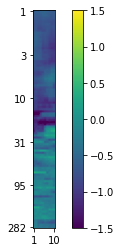

date:180325, rec:001, time:6661.0, label:1.0
date:180331, rec:007, time:4687.0, label:0.0


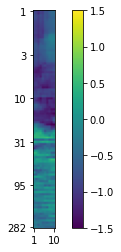

date:180325, rec:007, time:6523.0, label:0.0


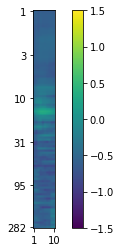

date:180330, rec:008, time:1111.0, label:0.0


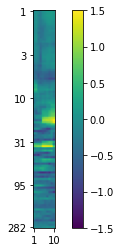

date:180325, rec:009, time:2050.0, label:0.0


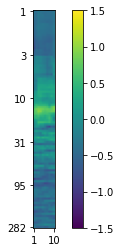

date:180410, rec:005, time:5407.0, label:1.0
date:180325, rec:004, time:5536.0, label:1.0
date:180325, rec:001, time:3400.0, label:1.0
date:180323, rec:002, time:7078.0, label:1.0
date:180327, rec:005, time:6018.0, label:0.0


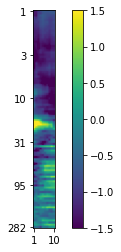

date:180401, rec:002, time:6194.0, label:1.0
date:180330, rec:001, time:670.0, label:0.0


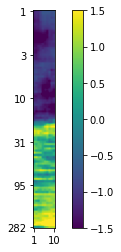

date:180401, rec:001, time:3886.0, label:1.0
date:180327, rec:001, time:4711.0, label:1.0
date:180331, rec:006, time:5189.0, label:1.0
date:180330, rec:007, time:1742.0, label:1.0
date:180325, rec:006, time:3643.0, label:1.0
date:180327, rec:001, time:6932.0, label:0.0


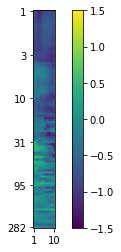

date:180327, rec:006, time:4588.0, label:1.0
date:180327, rec:004, time:2484.0, label:0.0


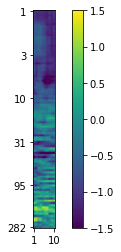

date:180327, rec:007, time:6931.0, label:0.0


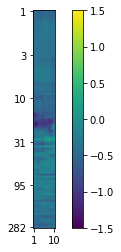

date:180401, rec:002, time:3366.0, label:1.0
date:180327, rec:007, time:4991.0, label:0.0


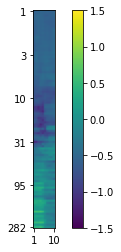

date:180329, rec:001, time:3981.0, label:1.0
date:180331, rec:007, time:830.0, label:1.0
date:180401, rec:001, time:940.0, label:0.0


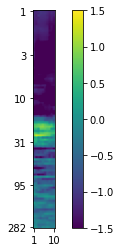

date:180323, rec:003, time:2901.0, label:1.0
date:180331, rec:003, time:790.0, label:1.0
date:180327, rec:008, time:4172.0, label:0.0


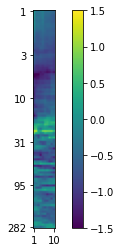

date:180330, rec:008, time:5625.0, label:0.0


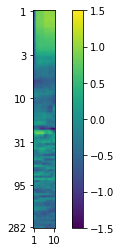

date:180323, rec:003, time:3121.0, label:1.0
date:180325, rec:007, time:2896.0, label:0.0


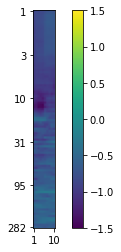

date:180327, rec:008, time:1882.0, label:0.0


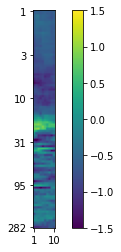

date:180331, rec:005, time:659.0, label:1.0
date:180330, rec:007, time:6138.0, label:1.0
date:180322, rec:007, time:3880.0, label:0.0


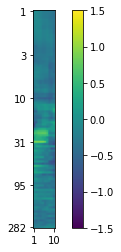

date:180331, rec:004, time:5037.0, label:1.0
date:180327, rec:008, time:3462.0, label:0.0


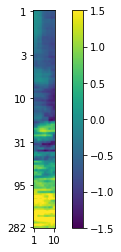

date:180331, rec:005, time:2492.0, label:1.0
date:180330, rec:001, time:840.0, label:0.0


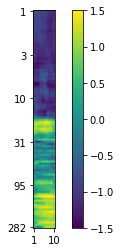

date:180325, rec:009, time:1410.0, label:0.0


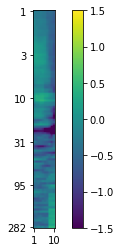

date:180324, rec:009, time:1007.0, label:0.0


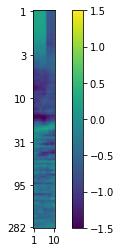

date:180324, rec:008, time:1521.0, label:0.0


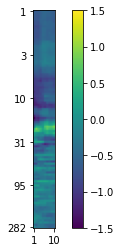

date:180327, rec:008, time:2692.0, label:0.0


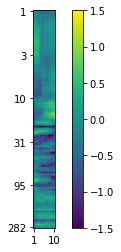

date:180322, rec:007, time:3339.0, label:0.0


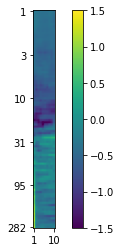

date:180331, rec:001, time:1670.0, label:0.0


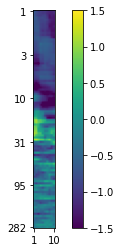

date:180324, rec:004, time:2429.0, label:1.0
date:180329, rec:004, time:270.0, label:1.0
date:180324, rec:006, time:3649.0, label:1.0
date:180330, rec:008, time:1731.0, label:0.0


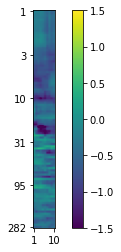

date:180331, rec:001, time:1970.0, label:0.0


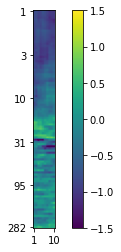

date:180325, rec:001, time:1050.0, label:0.0


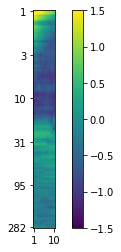

date:180324, rec:003, time:5838.0, label:1.0
date:180327, rec:001, time:360.0, label:0.0


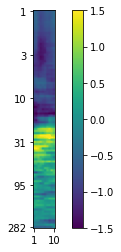

date:180410, rec:006, time:1576.0, label:1.0
date:180327, rec:007, time:6881.0, label:0.0


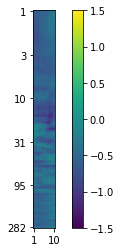

date:180325, rec:004, time:3450.0, label:1.0
date:180330, rec:001, time:3242.0, label:1.0
date:180325, rec:004, time:3040.0, label:1.0
date:180324, rec:004, time:6442.0, label:1.0
date:180330, rec:007, time:1792.0, label:1.0
date:180327, rec:007, time:5761.0, label:0.0


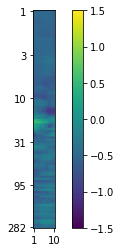

date:180410, rec:005, time:487.0, label:1.0
date:180329, rec:005, time:2155.0, label:1.0
date:180327, rec:001, time:5694.0, label:1.0
date:180330, rec:008, time:231.0, label:0.0


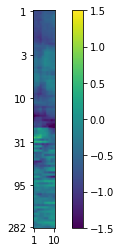

date:180327, rec:005, time:5478.0, label:0.0


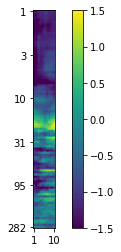

date:180327, rec:002, time:2390.0, label:1.0
date:180324, rec:003, time:5428.0, label:1.0
date:180325, rec:004, time:4594.0, label:1.0
date:180331, rec:007, time:2607.0, label:0.0


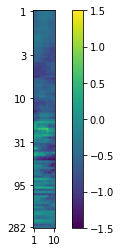

date:180330, rec:008, time:661.0, label:0.0


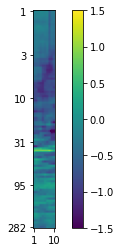

date:180327, rec:001, time:5734.0, label:1.0
date:180410, rec:004, time:5049.0, label:1.0
date:180324, rec:003, time:5418.0, label:1.0
date:180331, rec:004, time:5957.0, label:1.0
date:180322, rec:007, time:4930.0, label:0.0


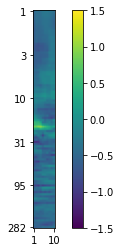

date:180327, rec:001, time:2180.0, label:0.0


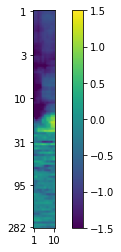

date:180331, rec:001, time:6674.0, label:1.0
date:180325, rec:003, time:7144.0, label:1.0
date:180330, rec:007, time:2808.0, label:1.0
date:180410, rec:004, time:6552.0, label:1.0
date:180327, rec:006, time:3706.0, label:1.0
date:180325, rec:007, time:4693.0, label:0.0


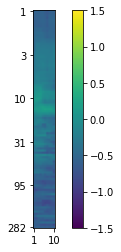

date:180325, rec:001, time:1540.0, label:0.0


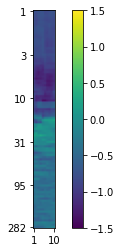

date:180330, rec:009, time:4891.0, label:0.0


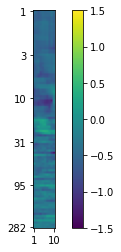

date:180331, rec:007, time:4617.0, label:0.0


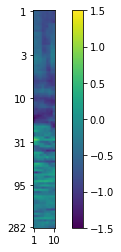

date:180331, rec:007, time:6448.0, label:0.0


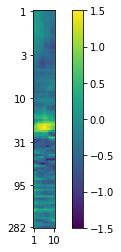

date:180329, rec:002, time:7144.0, label:1.0
date:180327, rec:007, time:3950.0, label:0.0


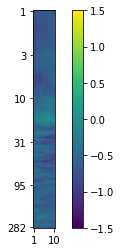

date:180327, rec:008, time:3032.0, label:0.0


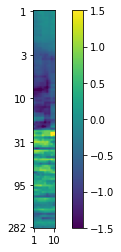

date:180331, rec:001, time:1280.0, label:0.0


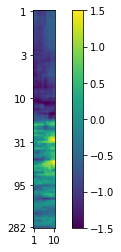

date:180327, rec:008, time:4703.0, label:0.0


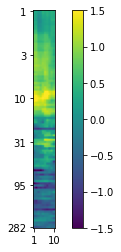

date:180324, rec:008, time:3603.0, label:0.0


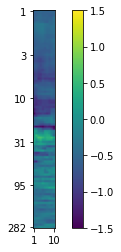

date:180325, rec:007, time:2586.0, label:0.0


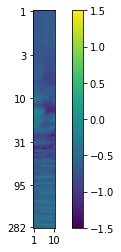

date:180324, rec:009, time:1158.0, label:0.0


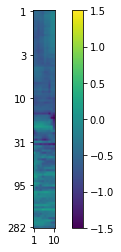

date:180325, rec:007, time:4703.0, label:0.0


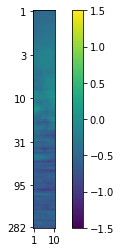

date:180330, rec:008, time:4327.0, label:0.0


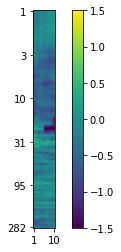

date:180324, rec:004, time:2609.0, label:1.0
date:180325, rec:009, time:900.0, label:0.0


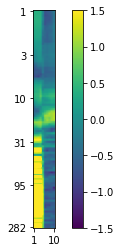

date:180330, rec:009, time:6871.0, label:0.0


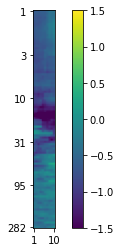

date:180410, rec:003, time:6614.0, label:1.0
date:180327, rec:006, time:1120.0, label:1.0
date:180325, rec:007, time:4883.0, label:0.0


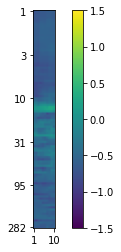

date:180323, rec:004, time:3553.0, label:1.0
date:180324, rec:005, time:320.0, label:1.0
date:180324, rec:004, time:4639.0, label:1.0
date:180330, rec:008, time:6875.0, label:0.0


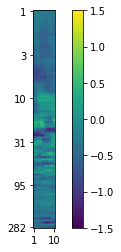

date:180331, rec:001, time:1590.0, label:0.0


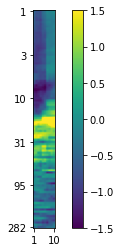

date:180327, rec:001, time:1680.0, label:0.0


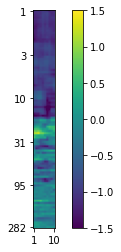

date:180323, rec:002, time:7178.0, label:1.0
date:180330, rec:008, time:4837.0, label:0.0


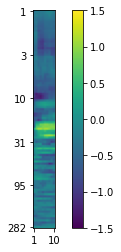

date:180327, rec:008, time:3922.0, label:0.0


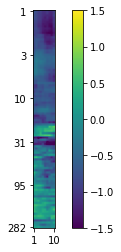

date:180410, rec:002, time:5552.0, label:1.0
date:180325, rec:003, time:6547.0, label:1.0
date:180324, rec:008, time:6934.0, label:0.0


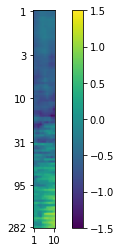

date:180329, rec:001, time:1714.0, label:0.0


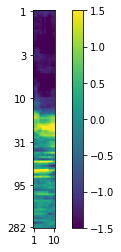

date:180330, rec:001, time:920.0, label:0.0


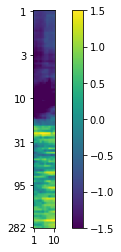

date:180325, rec:001, time:4996.0, label:1.0
date:180329, rec:004, time:5981.0, label:1.0
date:180330, rec:006, time:4552.0, label:1.0
date:180330, rec:008, time:2716.0, label:0.0


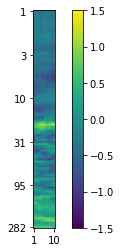

date:180322, rec:007, time:1747.0, label:0.0


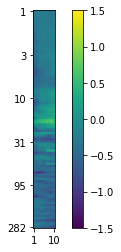

date:180327, rec:001, time:1310.0, label:0.0


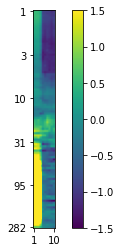

date:180325, rec:006, time:769.0, label:1.0
date:180327, rec:007, time:1690.0, label:0.0


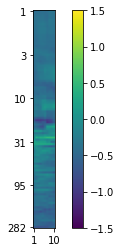

In [5]:
# movement labelled 0; non-movement labelled 1
for batch_idx, (data, label, date, rec, time) in enumerate(train_loader):
    for i in range(128):
        print('date:{}, rec:{}, time:{}, label:{}'.format(date[i], rec[i], time[i], label[i][0].numpy()))
        if label[i][0].numpy() == 0.0:
            data_sub = data[i][0]
            plt.yticks(ticks=[0, 20, 40, 60, 80, 99], labels=[round(np.logspace(0, 2.45, 100)[i]) for i in [0, 20, 40, 60, 80, 99]])
            plt.xticks(ticks=[0, 9], labels=[1, 10])
            plt.imshow(data_sub)
            plt.clim(-1.5, 1.5)
            plt.colorbar()
            plt.show()
    break

In [15]:
class MLP(nn.Module): # add dropo
    def __init__(self, input_dim=100*10*62, output_dim=1, embed_dim=256,drop_prob=0.):
        super(MLP, self).__init__()
        self.linear1 = nn.Linear(input_dim, embed_dim)
        self.linear2 = nn.Linear(embed_dim, output_dim)
        self.dropout = nn.Dropout(drop_prob)
        
    def forward(self, x):
        
        x = x.reshape([x.shape[0], 1, -1]).float()
        x = self.dropout(F.relu(self.linear1(x)))
        outputs = self.linear2(x)
        
        return outputs

In [16]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.001
num_epochs = 51
alpha = 0
model_type = 'MLP'
loss_type = 'bce'
reg_type = 'none'
input_dim = 62*10*100
embed_dim = 256

dropout_all = [0.1,0.3,0.5,0.7,0.9,1]





dropout:  0.1
Train loss for epoch 0: 3.9657773971557617
Val loss for epoch 0: 0.8815901875495911
Train loss for epoch 1: 1.791526436805725
Val loss for epoch 1: 0.9098458290100098
Train loss for epoch 2: 0.8601683378219604
Val loss for epoch 2: 0.8215339779853821
2
Train loss for epoch 3: 0.49716702103614807
Val loss for epoch 3: 1.3510117530822754
Train loss for epoch 4: 0.4661865532398224
Val loss for epoch 4: 0.8456701040267944
Train loss for epoch 5: 0.4148850440979004
Val loss for epoch 5: 0.9646753668785095
Train loss for epoch 6: 0.38942694664001465
Val loss for epoch 6: 1.1192330121994019
Train loss for epoch 7: 0.3544706702232361
Val loss for epoch 7: 0.9954057931900024
Train loss for epoch 8: 0.2903216481208801
Val loss for epoch 8: 1.2952461242675781
Train loss for epoch 9: 0.33069008588790894
Val loss for epoch 9: 1.4417754411697388
Train loss for epoch 10: 0.3608589172363281
Val loss for epoch 10: 2.145946741104126
Train loss for epoch 11: 0.3123403787612915
Val loss for 

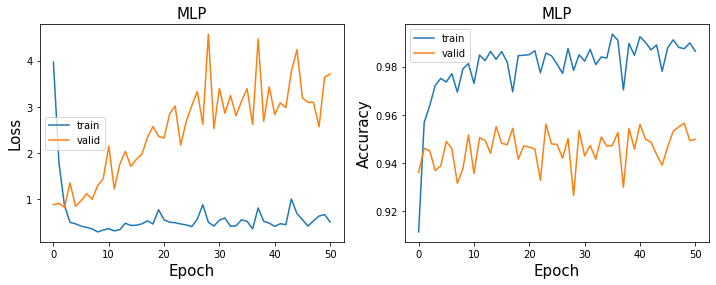

dropout:  0.3
Train loss for epoch 0: 4.303003787994385
Val loss for epoch 0: 0.8143492937088013
Train loss for epoch 1: 1.4418706893920898
Val loss for epoch 1: 0.6832268834114075
1
Train loss for epoch 2: 0.7925625443458557
Val loss for epoch 2: 1.0673679113388062
Train loss for epoch 3: 0.6229150891304016
Val loss for epoch 3: 0.5104517340660095
3
Train loss for epoch 4: 0.5429589152336121
Val loss for epoch 4: 0.9248471856117249
Train loss for epoch 5: 0.48712313175201416
Val loss for epoch 5: 0.9391450881958008
Train loss for epoch 6: 0.3525606691837311
Val loss for epoch 6: 0.9844361543655396
Train loss for epoch 7: 0.4149237275123596
Val loss for epoch 7: 0.9522169232368469
Train loss for epoch 8: 0.4777063727378845
Val loss for epoch 8: 1.5951457023620605
Train loss for epoch 9: 0.47584646940231323
Val loss for epoch 9: 1.2272026538848877
Train loss for epoch 10: 0.5460836291313171
Val loss for epoch 10: 1.9221307039260864
Train loss for epoch 11: 0.749923825263977
Val loss for

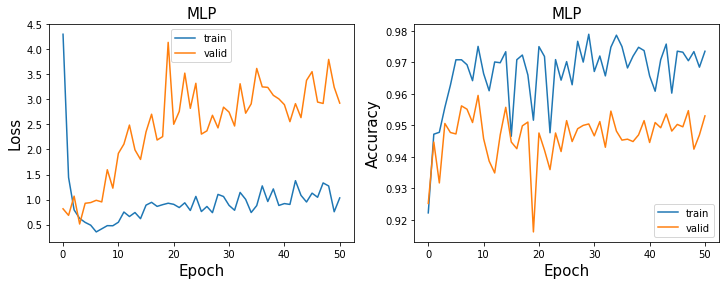

dropout:  0.5
Train loss for epoch 0: 4.988858699798584
Val loss for epoch 0: 1.36226224899292
Train loss for epoch 1: 2.055095672607422
Val loss for epoch 1: 1.271320104598999
1
Train loss for epoch 2: 2.077688694000244
Val loss for epoch 2: 1.8712611198425293
Train loss for epoch 3: 2.0443410873413086
Val loss for epoch 3: 1.0694663524627686
3
Train loss for epoch 4: 1.8478763103485107
Val loss for epoch 4: 1.2551547288894653
Train loss for epoch 5: 1.9440746307373047
Val loss for epoch 5: 1.5058112144470215
Train loss for epoch 6: 1.9691656827926636
Val loss for epoch 6: 1.3649311065673828
Train loss for epoch 7: 2.059309959411621
Val loss for epoch 7: 1.7369197607040405
Train loss for epoch 8: 1.9967554807662964
Val loss for epoch 8: 1.5240535736083984
Train loss for epoch 9: 1.808236002922058
Val loss for epoch 9: 1.6547811031341553
Train loss for epoch 10: 2.0140340328216553
Val loss for epoch 10: 1.7362953424453735
Train loss for epoch 11: 2.063366413116455
Val loss for epoch 11

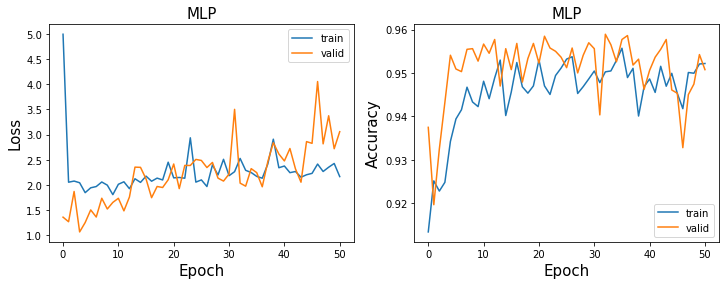

dropout:  0.7
Train loss for epoch 0: 5.059729099273682
Val loss for epoch 0: 1.3192740678787231
Train loss for epoch 1: 3.2893435955047607
Val loss for epoch 1: 1.233559489250183
1
Train loss for epoch 2: 3.2615723609924316
Val loss for epoch 2: 1.170613408088684
2
Train loss for epoch 3: 3.140754222869873
Val loss for epoch 3: 1.2294129133224487
Train loss for epoch 4: 3.179948091506958
Val loss for epoch 4: 1.2864214181900024
Train loss for epoch 5: 3.0228962898254395
Val loss for epoch 5: 1.4759588241577148
Train loss for epoch 6: 3.0243184566497803
Val loss for epoch 6: 1.5279077291488647
Train loss for epoch 7: 3.236572504043579
Val loss for epoch 7: 1.4469764232635498
Train loss for epoch 8: 3.1430492401123047
Val loss for epoch 8: 1.4726132154464722
Train loss for epoch 9: 3.1740310192108154
Val loss for epoch 9: 1.7054555416107178
Train loss for epoch 10: 3.3192126750946045
Val loss for epoch 10: 1.4760632514953613
Train loss for epoch 11: 3.2928173542022705
Val loss for epoch

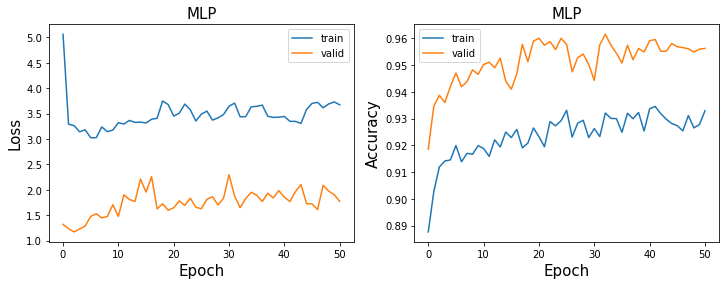

dropout:  0.9
Train loss for epoch 0: 10.752181053161621
Val loss for epoch 0: 1.6837190389633179
Train loss for epoch 1: 5.334392547607422
Val loss for epoch 1: 1.531203269958496
1
Train loss for epoch 2: 5.03993034362793
Val loss for epoch 2: 1.7796014547348022
Train loss for epoch 3: 4.94086217880249
Val loss for epoch 3: 1.8441808223724365
Train loss for epoch 4: 5.016554355621338
Val loss for epoch 4: 1.8410276174545288
Train loss for epoch 5: 4.9301018714904785
Val loss for epoch 5: 1.7555971145629883
Train loss for epoch 6: 5.098346710205078
Val loss for epoch 6: 1.9354579448699951
Train loss for epoch 7: 5.043955326080322
Val loss for epoch 7: 1.955390453338623
Train loss for epoch 8: 4.972043514251709
Val loss for epoch 8: 1.8710441589355469
Train loss for epoch 9: 5.139987945556641
Val loss for epoch 9: 2.1213552951812744
Train loss for epoch 10: 5.256657123565674
Val loss for epoch 10: 2.090392827987671
Train loss for epoch 11: 5.030457973480225
Val loss for epoch 11: 2.0547

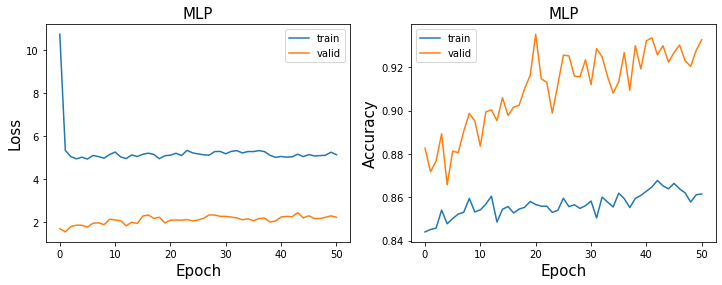

dropout:  1
Train loss for epoch 0: 0.6871312856674194
Val loss for epoch 0: 0.7174107432365417
Train loss for epoch 1: 0.6839108467102051
Val loss for epoch 1: 0.7328992486000061
Train loss for epoch 2: 0.6837891340255737
Val loss for epoch 2: 0.7385718822479248
Train loss for epoch 3: 0.6837958693504333
Val loss for epoch 3: 0.7359949350357056
Train loss for epoch 4: 0.6837856769561768
Val loss for epoch 4: 0.7397742867469788
Train loss for epoch 5: 0.6837875843048096
Val loss for epoch 5: 0.7387785315513611
Train loss for epoch 6: 0.6837853193283081
Val loss for epoch 6: 0.7366488575935364
Train loss for epoch 7: 0.6837770342826843
Val loss for epoch 7: 0.7347314357757568
Train loss for epoch 8: 0.6837903261184692
Val loss for epoch 8: 0.7398664951324463
Train loss for epoch 9: 0.6837917566299438
Val loss for epoch 9: 0.7386825680732727
Train loss for epoch 10: 0.683788001537323
Val loss for epoch 10: 0.7383804321289062
Train loss for epoch 11: 0.6837843060493469
Val loss for epoch 

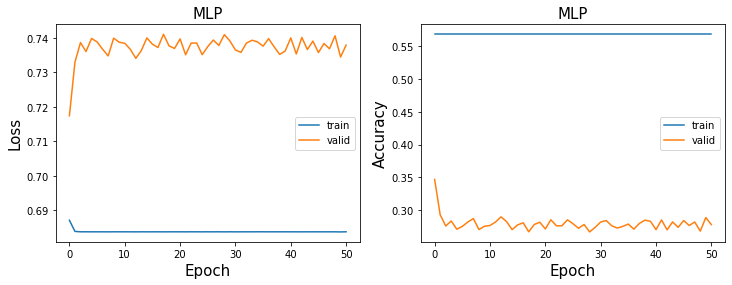

In [10]:


for d in range(0,len(dropout_all)):
    dropout = dropout_all[d]
    model = MLP(input_dim=input_dim, embed_dim=embed_dim,drop_prob = dropout).to(device)
    (data, labels, _, _, _) = next(iter(train_loader))
    data = data.to(device)
    output = model(data)
    output.shape
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    print('dropout: ', dropout)

    epochs, training_losses, training_acc, val_losses, validation_acc = [], [], [], [], []

    for epoch in range(num_epochs):
        train_loss, train_acc = train(model, optimizer, train_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, 
                                      reg_type=reg_type, collect_result=False, device=device)
        print('Train loss for epoch {}: {}'.format(epoch, train_loss))
        val_loss, val_acc = evaluate(model, optimizer, val_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, 
                                     reg_type=reg_type, collect_result=False, device=device)
        print('Val loss for epoch {}: {}'.format(epoch, val_loss))
        if epoch == 0:
            torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_DO{}_EMBED{}_EPOCH{}_MODEL_{}.pt'.format(
                    save_path, model_type, CH, loss_type, reg_type, alpha, dropout, embed_dim, epoch,model_name))
        if val_losses:
            if val_loss < min(val_losses):
                best_epoch = epoch
                print(epoch)
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_DO{}_EMBED{}_EPOCH{}_MODEL_{}.pt'.format(
                    save_path, model_type, CH, loss_type, reg_type, alpha, dropout, embed_dim, epoch,model_name))
        epochs.append(epoch)
        training_losses.append(train_loss)
        training_acc.append(train_acc)
        val_losses.append(val_loss)
        validation_acc.append(val_acc)

        if train_loss < tol:
            break
    plot_loss_acc(training_losses, val_losses, training_acc, validation_acc, model_type)



In [17]:
model_MLP = os.listdir(save_path)
results = []
for x in range(0,len(model_MLP)):
    result = model_MLP[x].split('_') 
    channel = [i for i,item in enumerate(np.array(result)) if "CHall" in item]
    if not(channel):
        continue
    else:
        model_dropout = [i for i,item in enumerate(np.array(result)) if "DO" in item]
        if not(model_dropout):
            continue
        else:
            dropout = [int(i) for i in result[model_dropout[0]] if i.isdigit()]
            if len(dropout) ==2:
                dropout = dropout[1]/10
            else:
                dropout = dropout[0]
            epoch_name = [i for i,item in enumerate(np.array(result)) if "EPOCH" in item]
            res = [int(i) for i in result[epoch_name[0]] if i.isdigit()]
            if len(res) > 1:
                epoch_result = res[0]*10+res[1]
            else:
                epoch_result = res[0]
            results.append([dropout, epoch_result])

results = pd.DataFrame(np.array(results), columns=['dropout', 'epoch'])
best_results = results.groupby('dropout').max('epoch')
print(best_results)

         epoch
dropout       
0.1        2.0
0.3        3.0
0.5        3.0
0.7        2.0
0.9        1.0
1.0        0.0


/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.1_EPOCH2.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


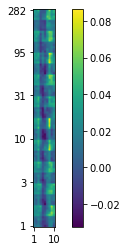

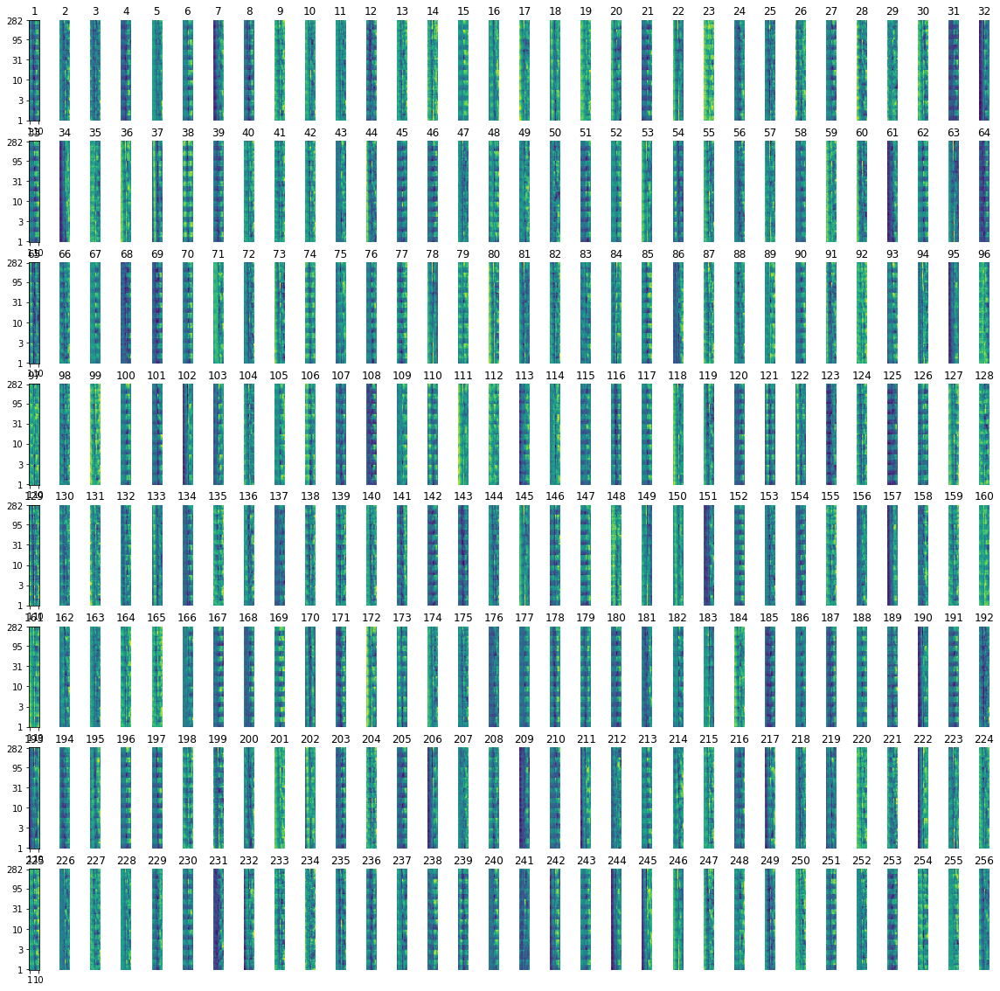

test loss:1.5317248106002808 accuracy:0.9248451255298337


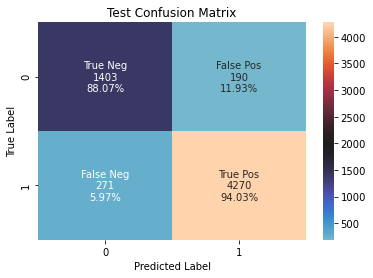

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.3_EPOCH3.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


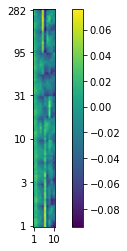

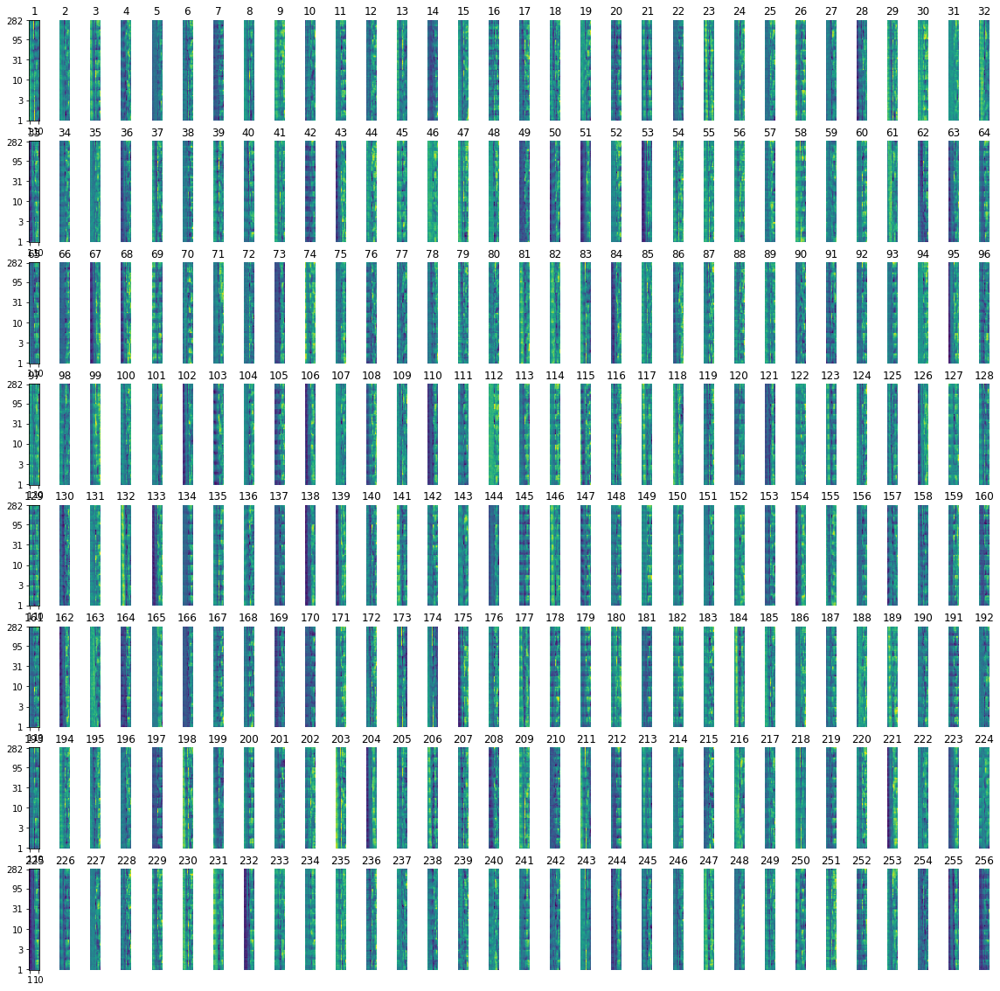

test loss:1.160974144935608 accuracy:0.9158787088359961


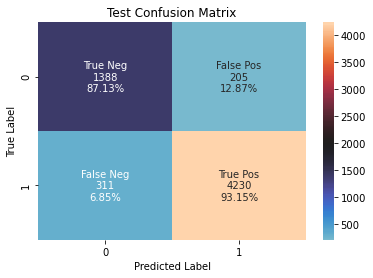

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.5_EPOCH3.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


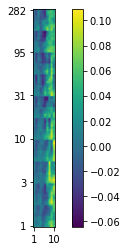

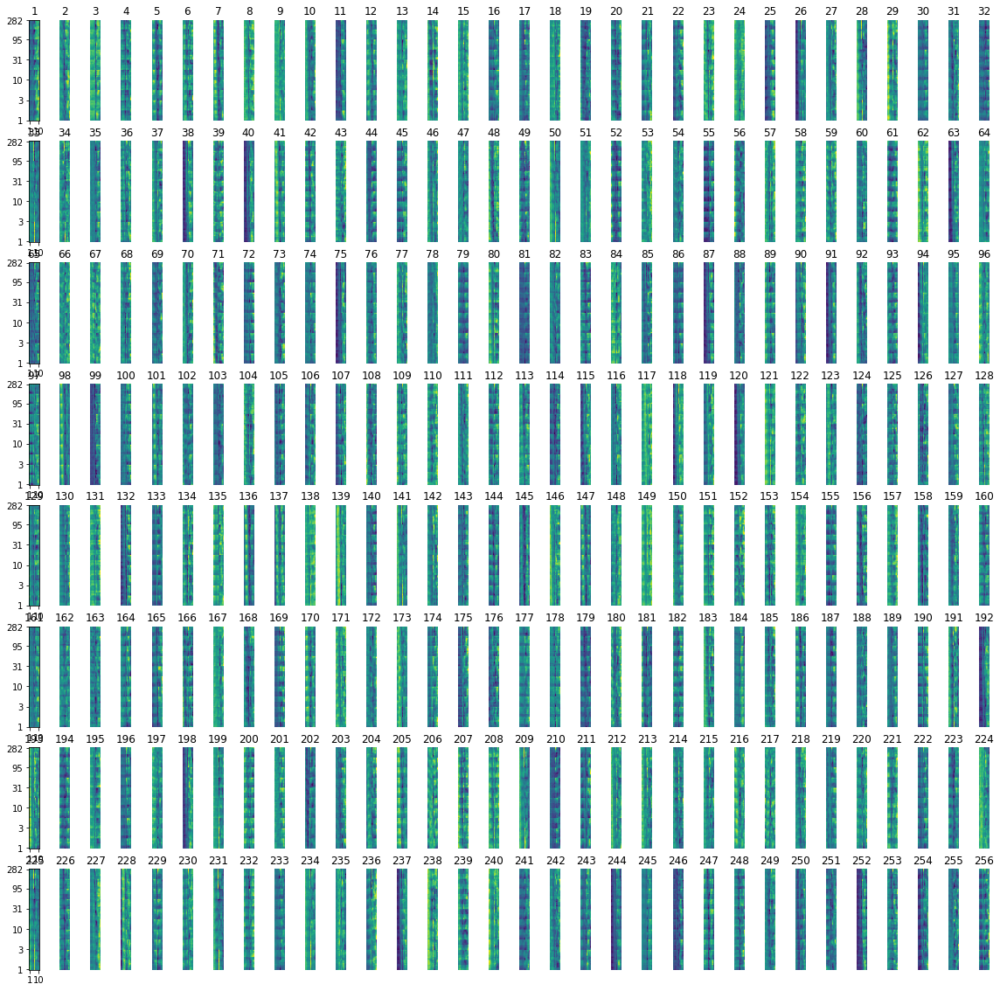

test loss:2.665302038192749 accuracy:0.9193022497554614


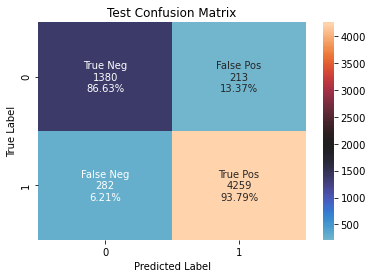

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.7_EPOCH2.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


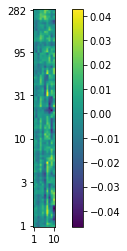

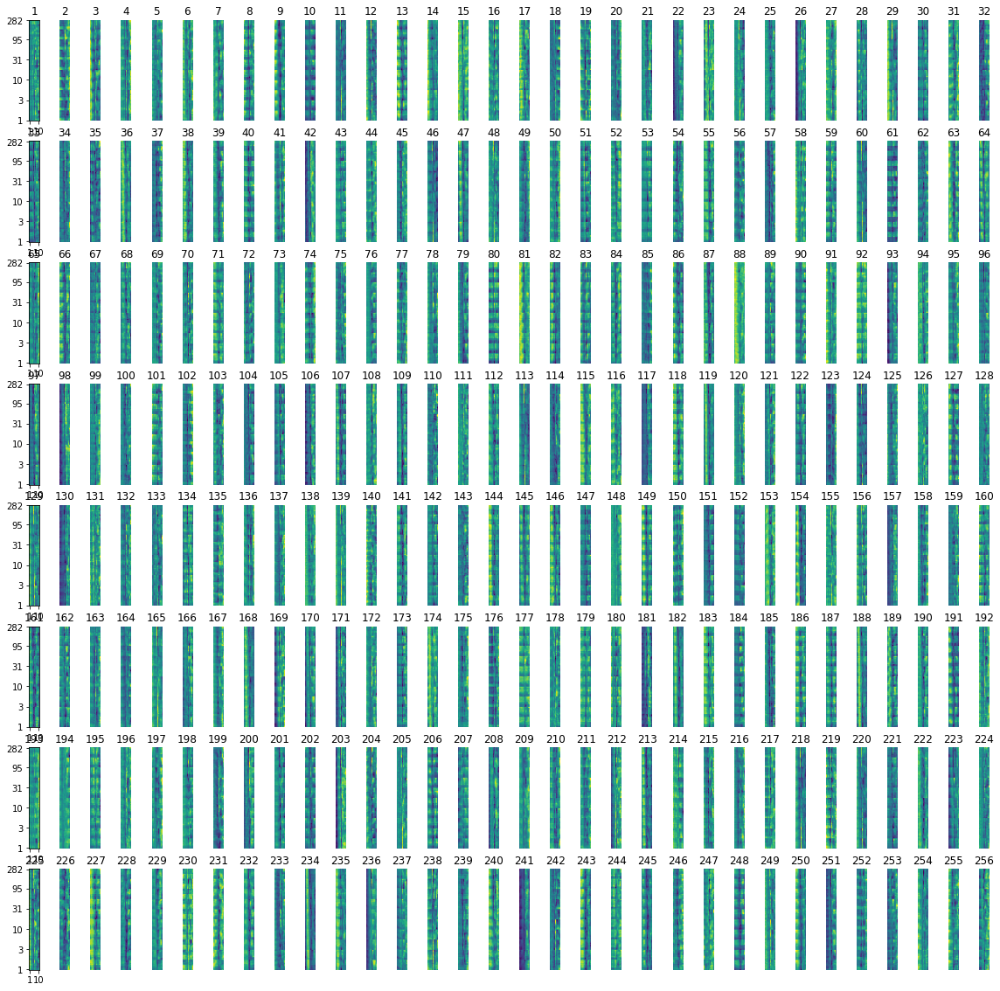

test loss:2.446345329284668 accuracy:0.9144114770133681


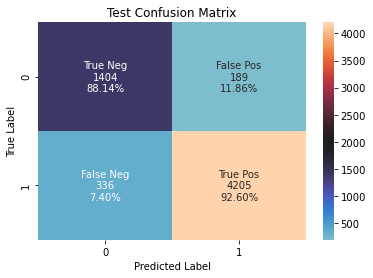

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.9_EPOCH1.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


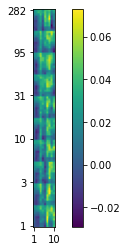

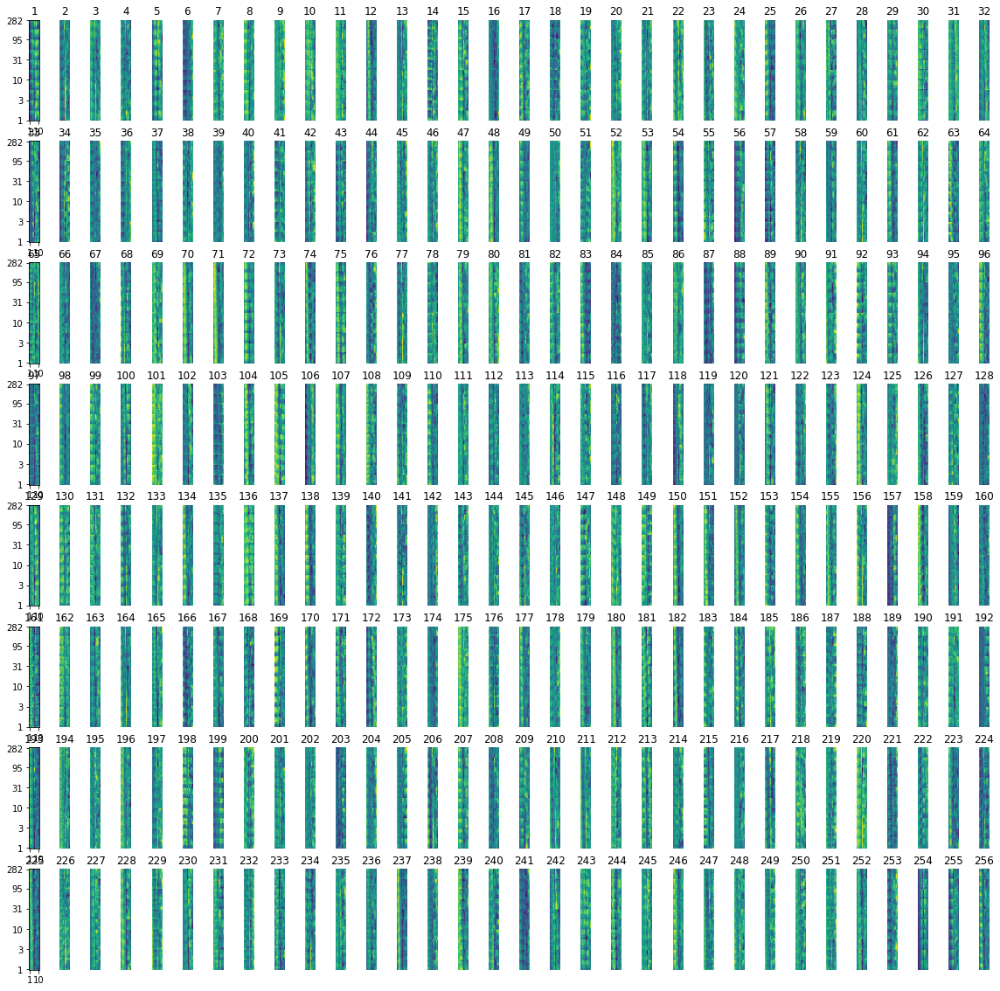

test loss:2.888144016265869 accuracy:0.856537332898598


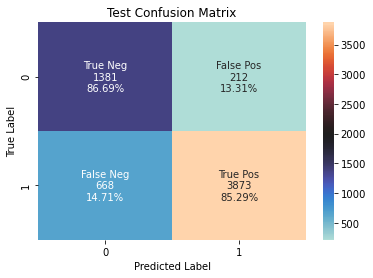

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO1_EPOCH0.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


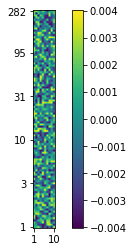

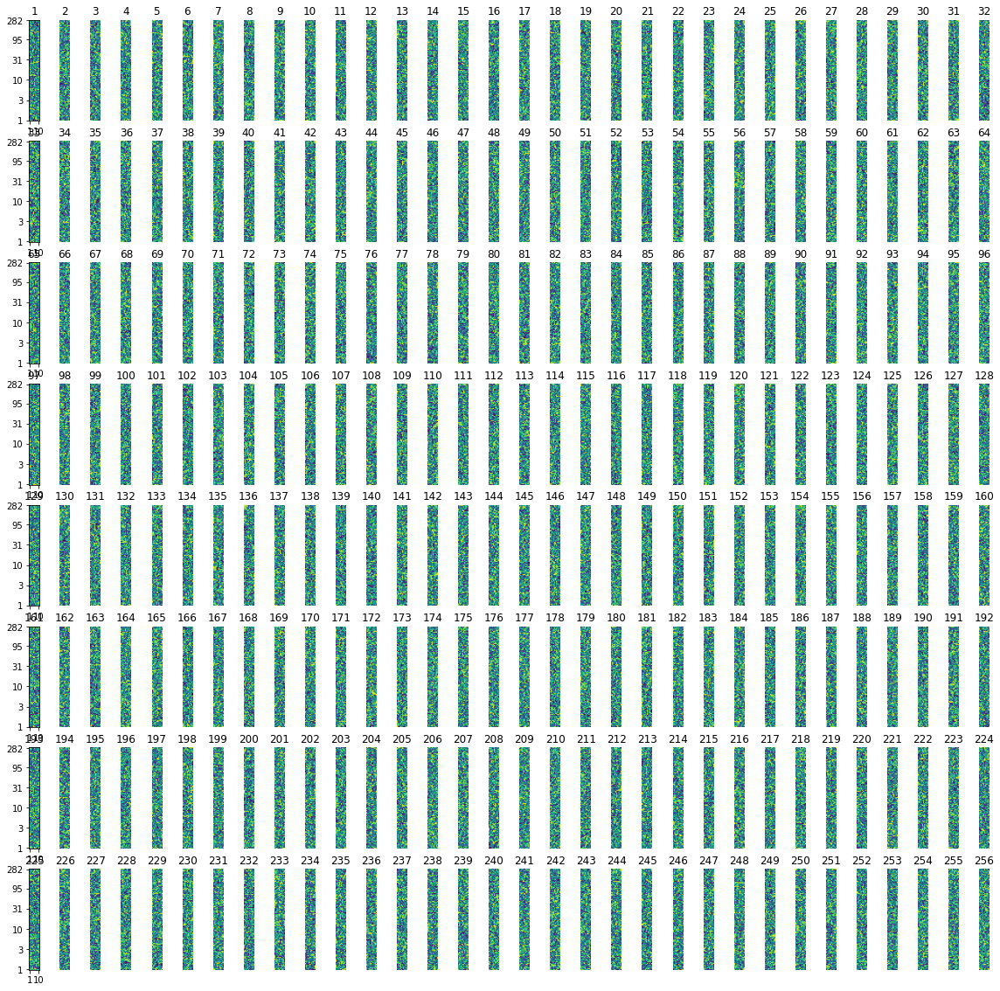

test loss:0.7085584998130798 accuracy:0.43495272253015976


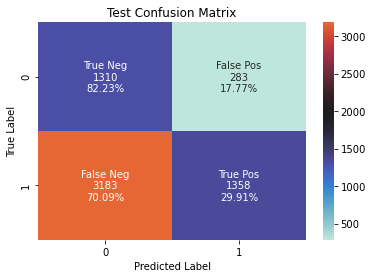

In [22]:
for i,(index,row) in enumerate(best_results.iterrows()):
    model = MLP().to(device)
    path = save_path
    if index == 1.0:
        index = 1
    DO = index
    best_epoch = int(row)
    ## Load best model
    model = MLP(input_dim=input_dim, embed_dim=embed_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    model.load_state_dict(torch.load('{}{}_CH{}_LOSS{}_REG{}{}_DO{}_EMBED{}_EPOCH{}_MODEL_{}.pt'.format(
    save_path, model_type, CH, loss_type, reg_type, alpha, DO, embed_dim, best_epoch,model_name)))
    print('{}{}_CH{}_LOSS{}_REG{}{}_DO{}_EPOCH{}.pt'.format(path, model_type, CH, loss_type, reg_type, alpha,DO, best_epoch))
    
    # Print Shape
    w1 = model.linear1.weight
    print(w1.shape)
    w1 = model.linear1.weight.view(256,62,10,100)
    w2 = model.linear2.weight
    print(w1.shape, w2.shape)
    w1 = w1.detach().cpu().numpy()
    w2 = w2.detach().cpu().numpy()
    print(w1[0][0].shape)
    
    # Print feature
    print('One feature')
    plt.yticks(ticks=[0, 20, 40, 60, 80, 99], labels=[round(np.logspace(0, 2.45, 100)[i]) for i in [0, 20, 40, 60, 80, 99]])
    plt.xticks(ticks=[0, 9], labels=[1, 10])
    plt.imshow(w1[0][0].transpose(),origin='lower')
    # plt.clim(-1.5, 1.5)
    plt.colorbar()
    plt.show()
    
    # All features
    timewindow = 10
    plt.figure(figsize=(20,20))
    ylabels_list = [0,32,64,96,128,160,192,224,256] 
    for i in range(256):
        weights_sub = w1[i]
        plt.subplot(8,32,i+1)
        if i in ylabels_list:
            plt.yticks(ticks=[0, 20, 40, 60, 80, 99], labels=[round(np.logspace(0, 2.45, 100)[i]) for i in [0, 20, 40, 60, 80, 99]])
            plt.xticks(ticks=[0, timewindow-1], labels=[1, timewindow])
        else:
            plt.axis('off')
    #     plt.imshow(weights_sub)
        plt.imshow(w1[i][0].transpose(),origin='lower')
        plt.title(str(i+1))
    plt.show()
    
    
    ## Calculate accuracy and test loss
    test_loss, test_acc, test_preds, test_preds_probs, test_labels,_,_,_, cases_wrong_0 = evaluate(model, optimizer, test_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
    print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
       
    ## Confusion matrix
    predictions_test = np.concatenate(test_preds)
    labels_test = np.concatenate(test_labels)

    df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

    cm_test = confusion_matrix(labels_test, predictions_test)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_test.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
    ax.set_title('Test Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    
    


/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.1_EPOCH2.pt
val loss:0.8215339779853821, val accuracy:0.9450151057401812, val percentage postive:0.8261329531669617


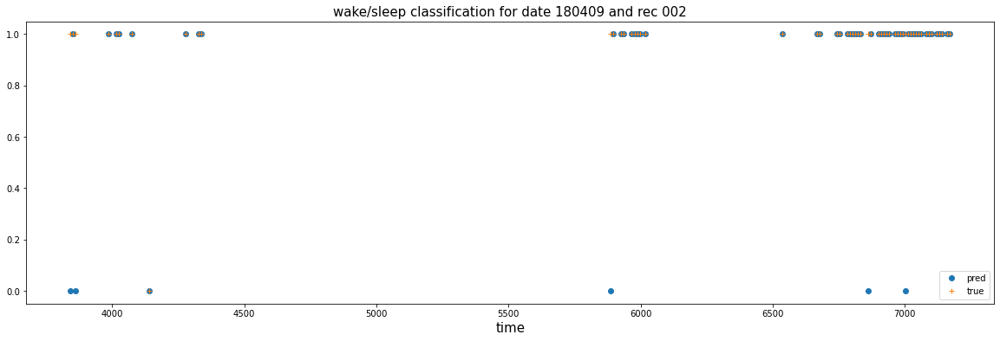

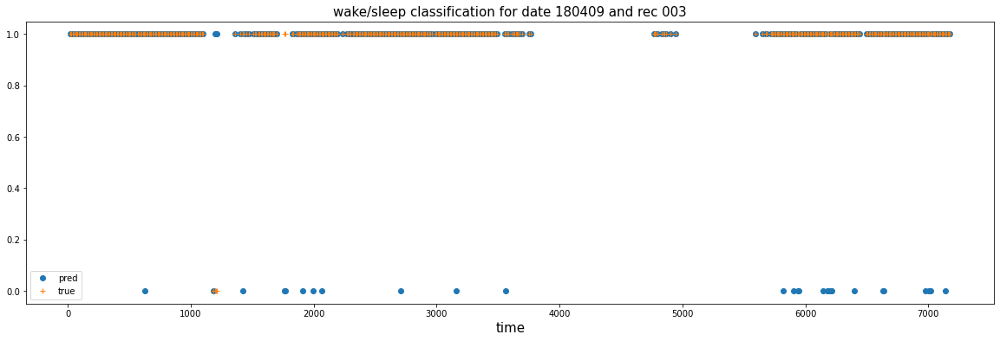

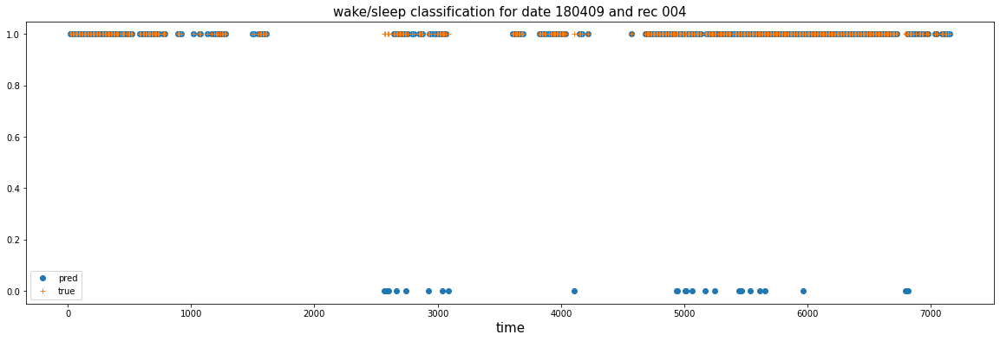

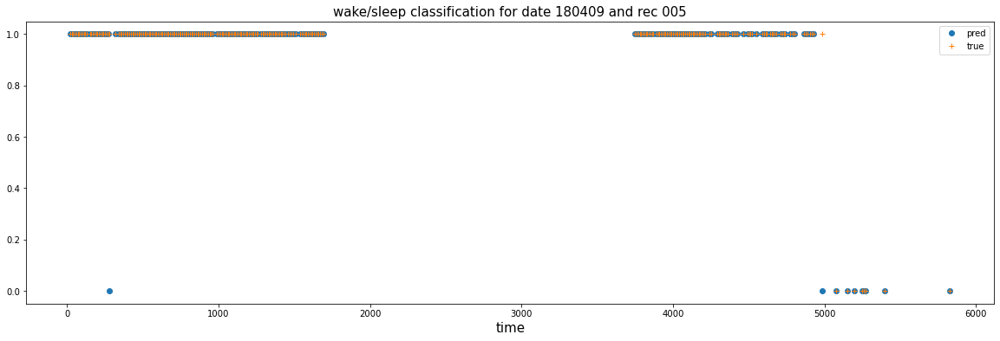

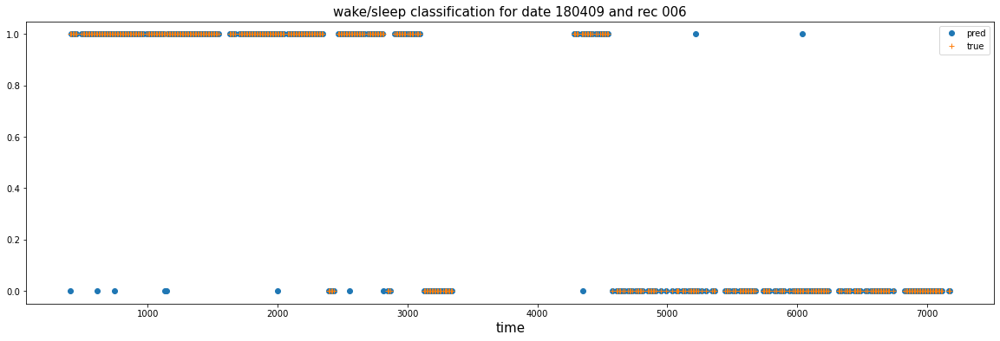

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.3_EPOCH3.pt
val loss:0.5104517340660095, val accuracy:0.9506042296072508, val percentage postive:0.8261329531669617


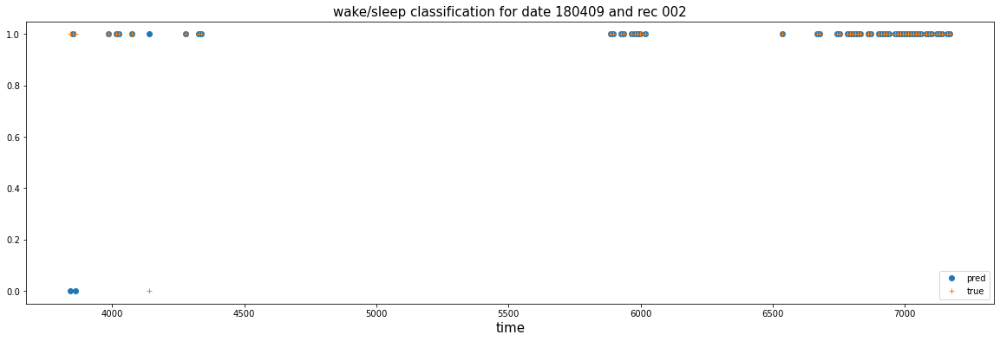

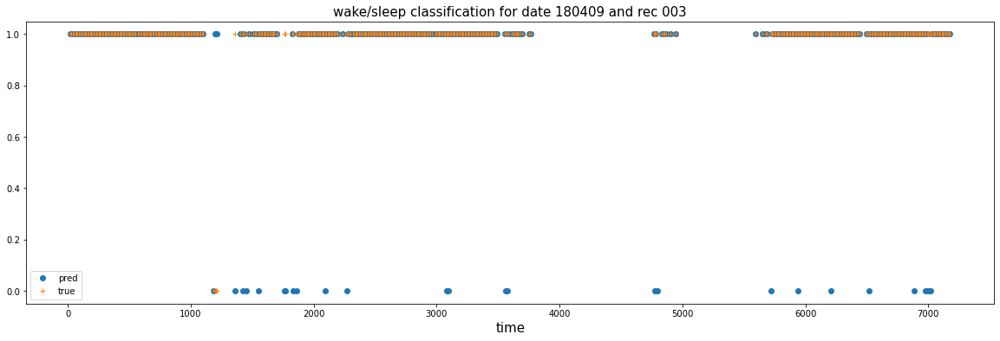

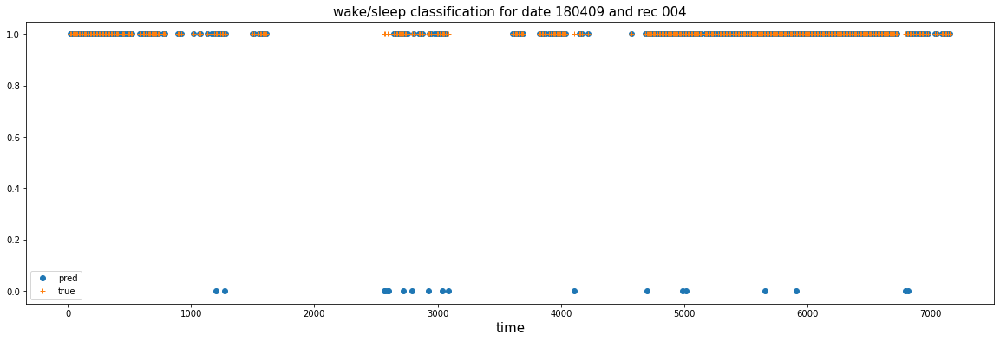

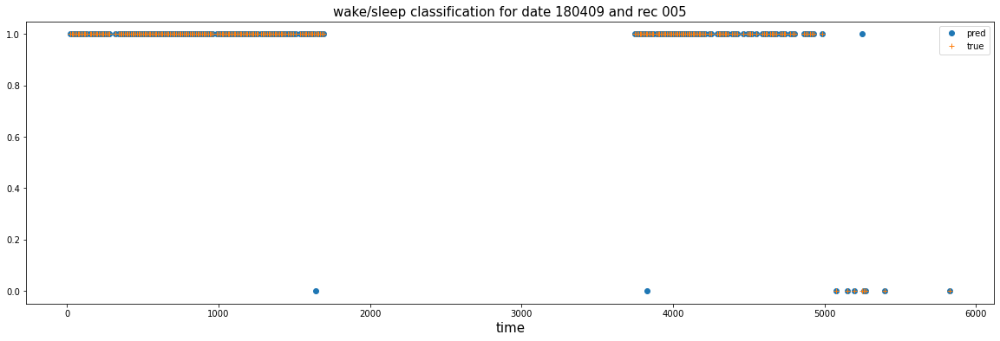

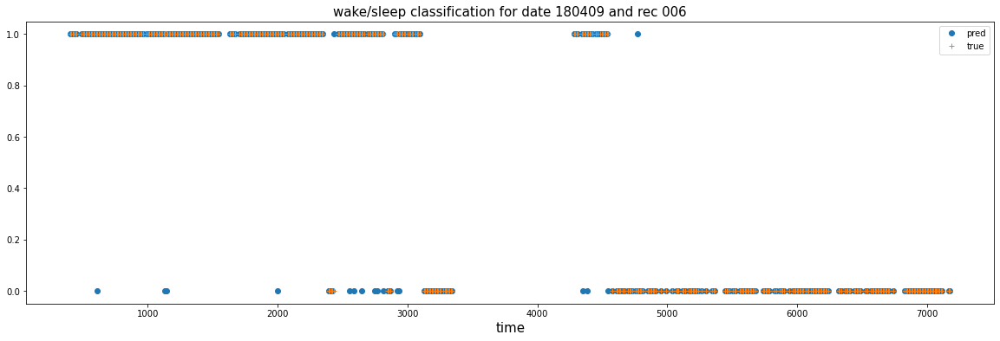

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.5_EPOCH3.pt
val loss:1.0694663524627686, val accuracy:0.943202416918429, val percentage postive:0.8261329531669617


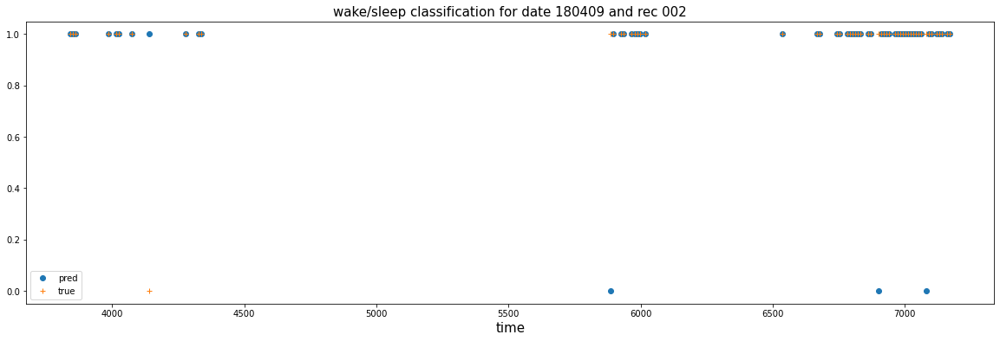

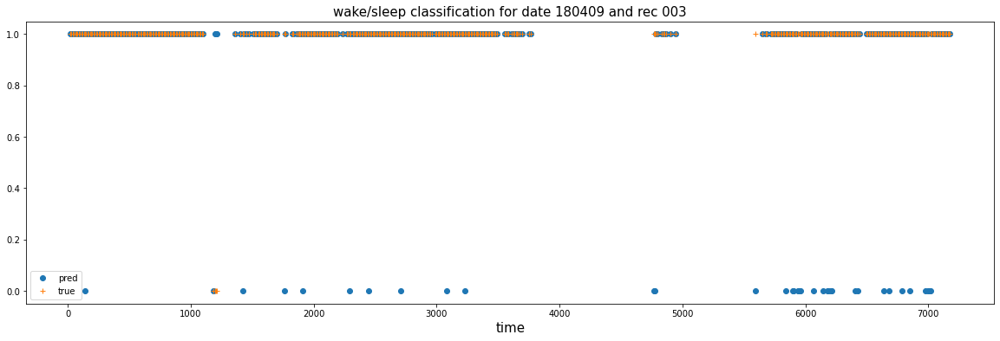

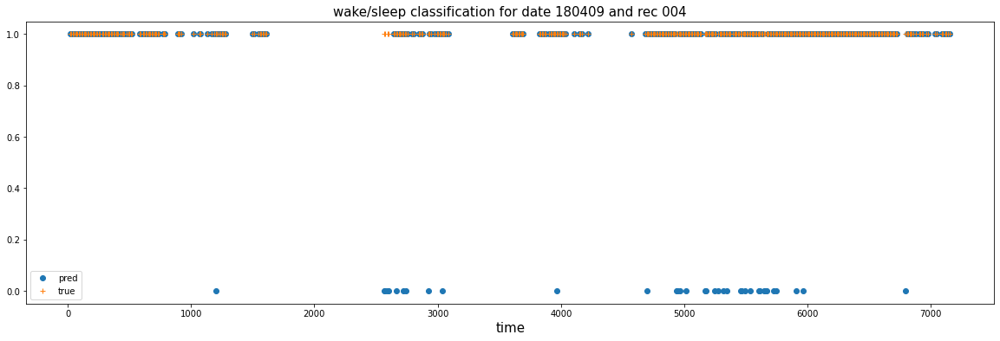

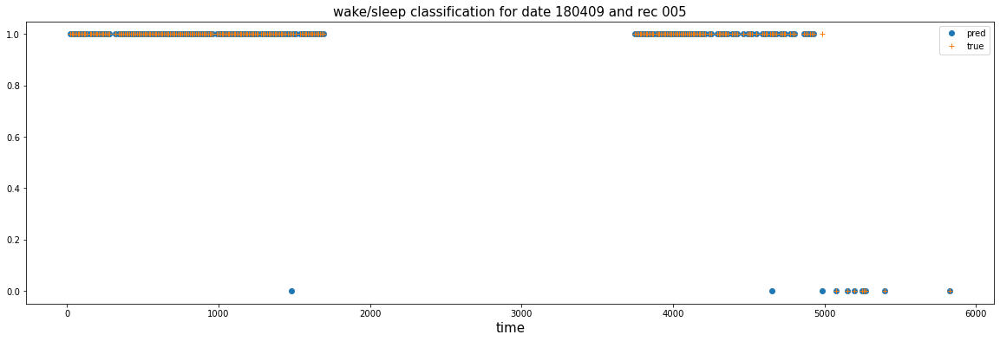

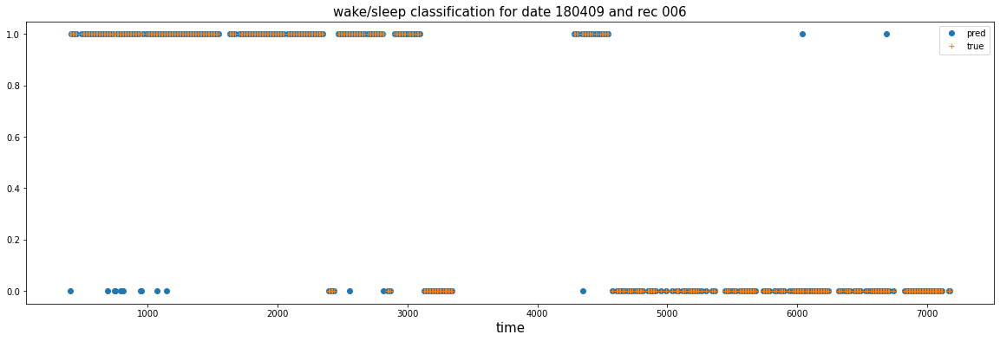

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.7_EPOCH2.pt
val loss:1.170613408088684, val accuracy:0.9386706948640483, val percentage postive:0.8261329531669617


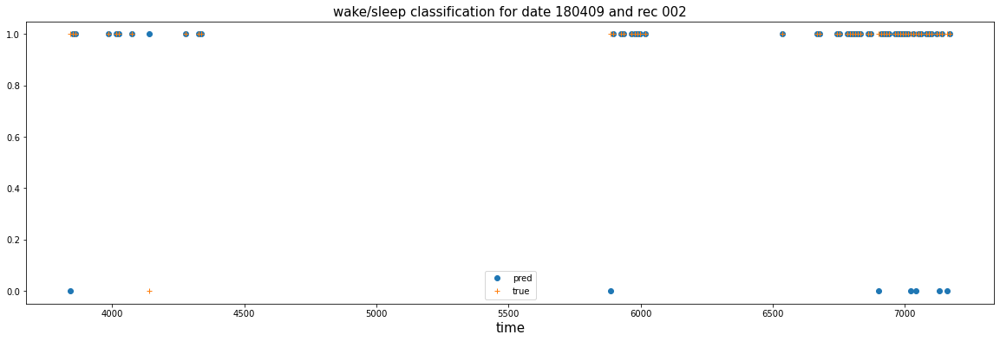

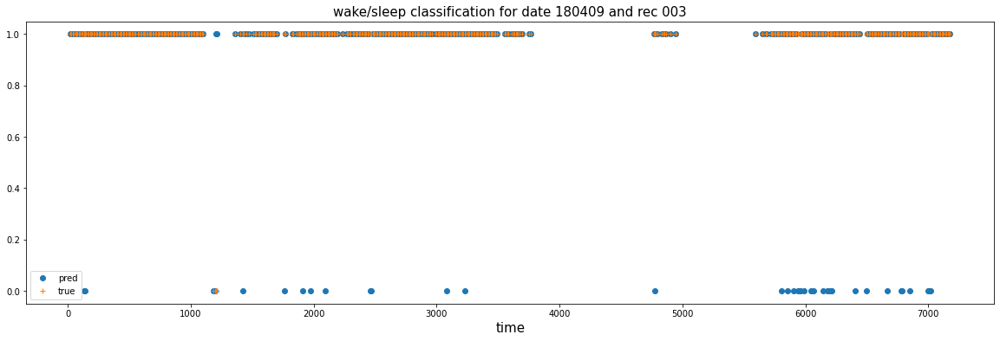

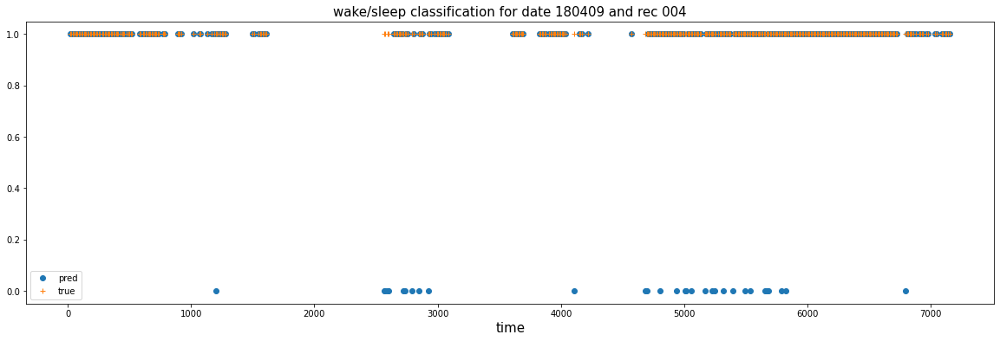

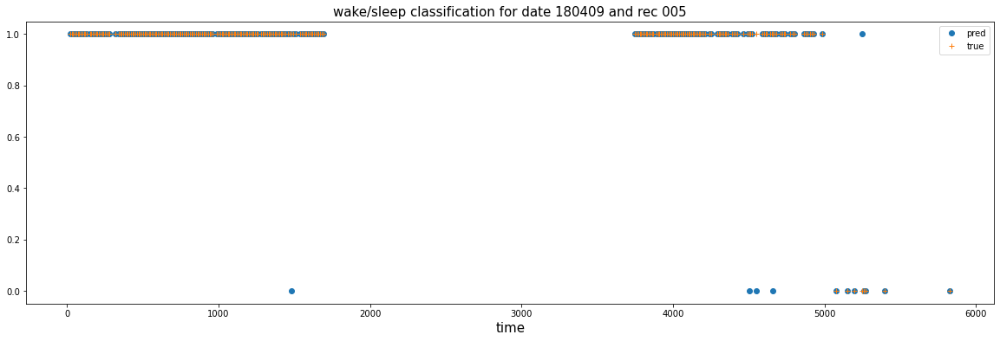

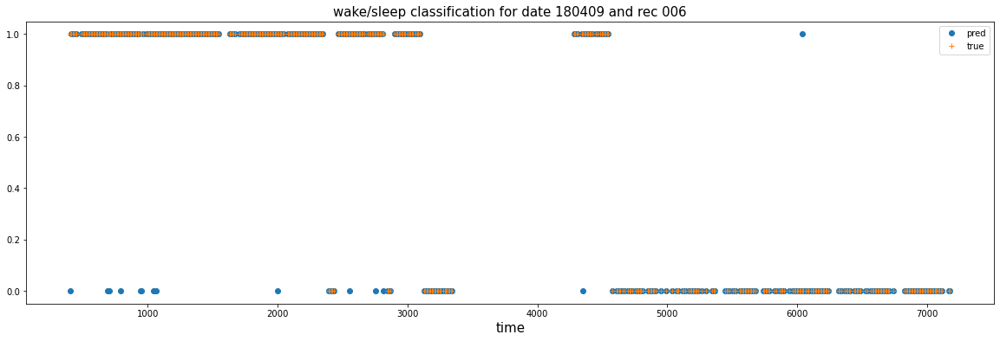

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO0.9_EPOCH1.pt
val loss:1.531203269958496, val accuracy:0.8717522658610272, val percentage postive:0.8261329531669617


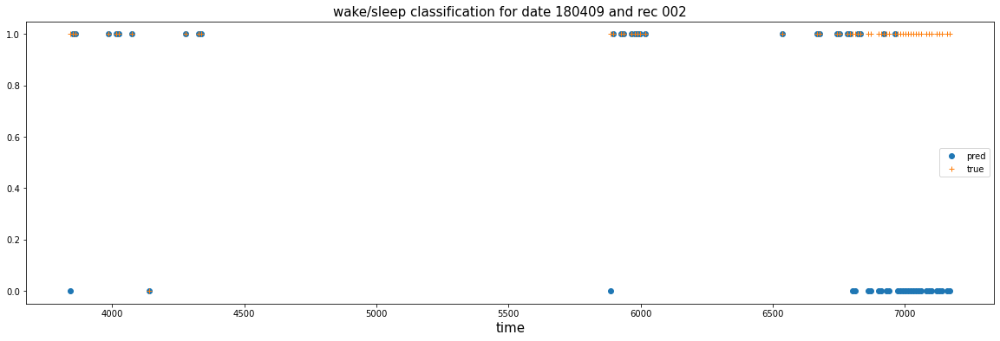

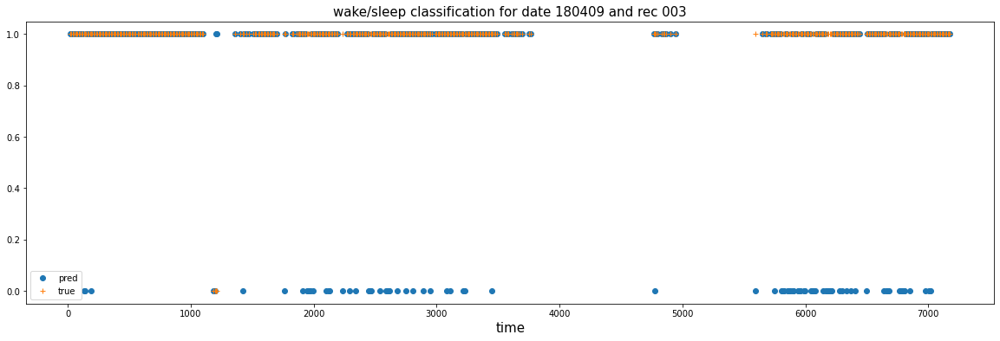

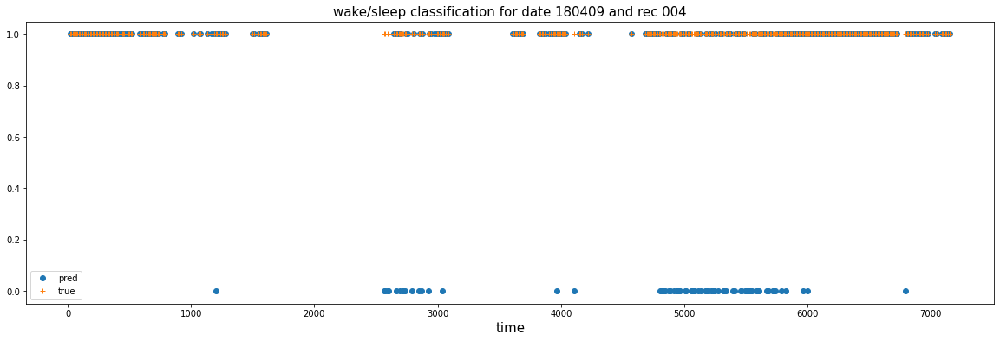

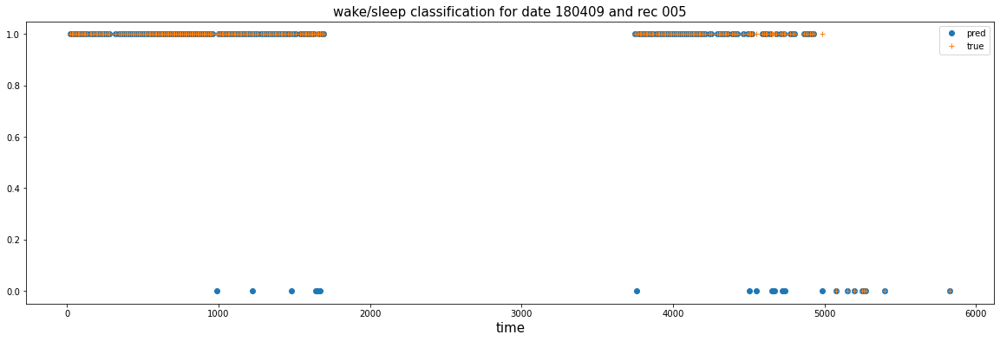

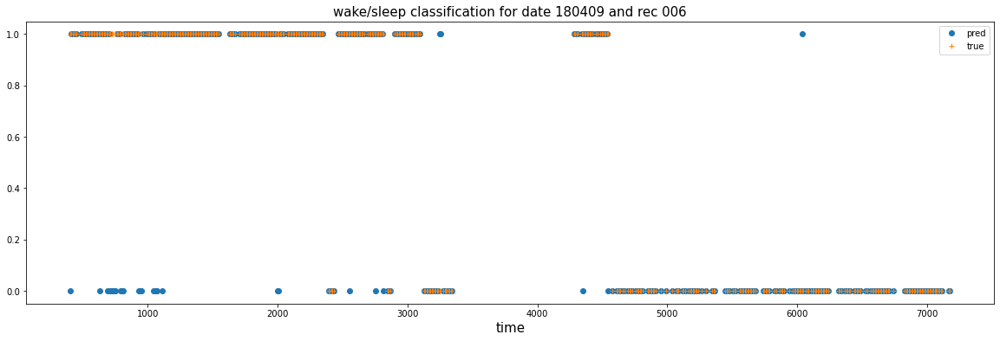

/home/bijanadmin/Desktop/Goose_data/data_Goose_all_2/Goose_ANN_models/MLP_CHall_LOSSbce_REGnone0_DO1_EPOCH0.pt
val loss:0.7174107432365417, val accuracy:0.3468277945619335, val percentage postive:0.8261329531669617


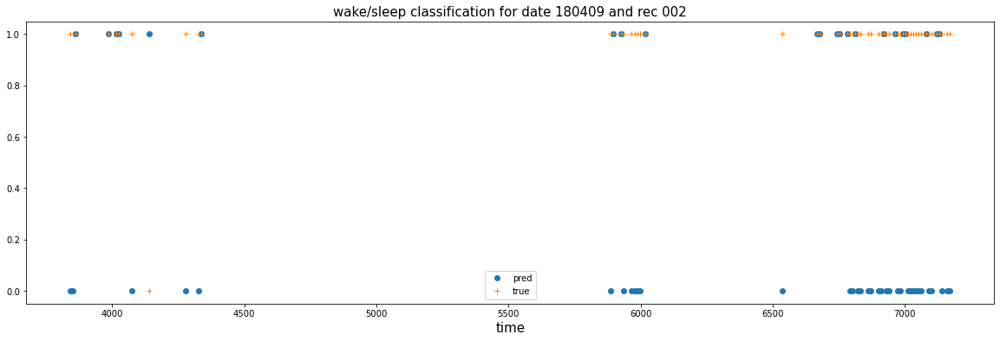

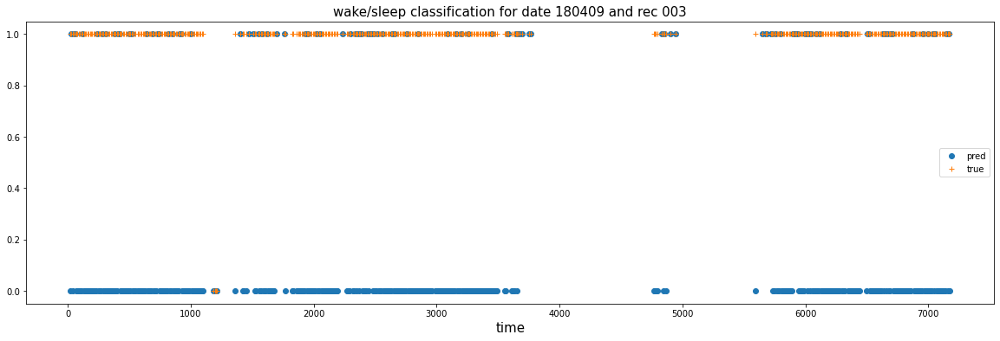

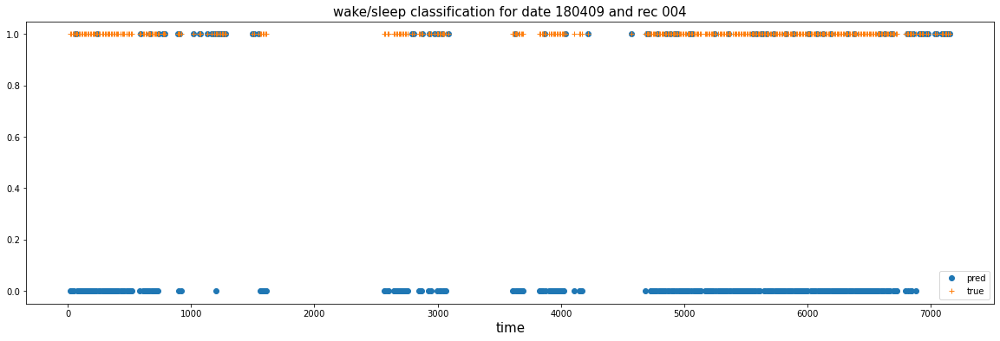

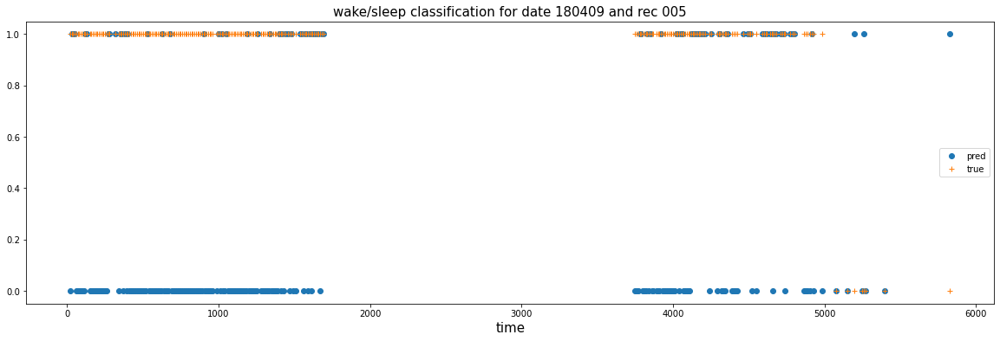

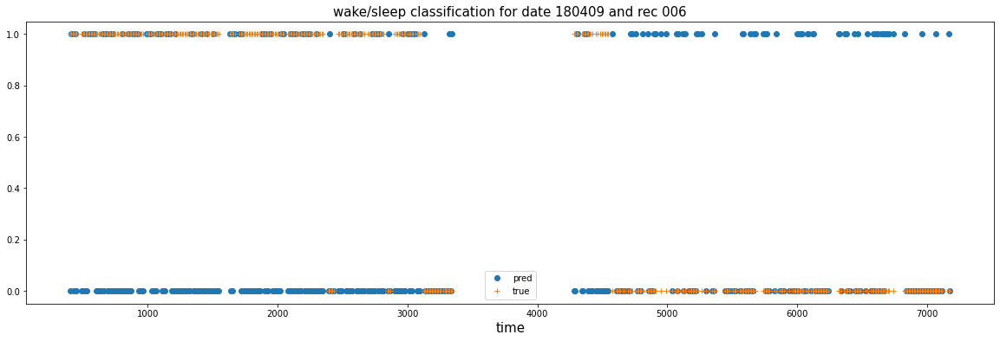

In [29]:
for i,(index,row) in enumerate(best_results.iterrows()):
    model = MLP().to(device)
    path = save_path
    if index == 1.0:
        index = 1
    DO = index
    best_epoch = int(row)
    ## Load best model
    model = MLP(input_dim=input_dim, embed_dim=embed_dim).to(device)
    model.load_state_dict(torch.load('{}{}_CH{}_LOSS{}_REG{}{}_DO{}_EMBED{}_EPOCH{}_MODEL_{}.pt'.format(
    save_path, model_type, CH, loss_type, reg_type, alpha, DO, embed_dim, best_epoch,model_name)))
    print('{}{}_CH{}_LOSS{}_REG{}{}_DO{}_EPOCH{}.pt'.format(path, model_type, CH, loss_type, reg_type, alpha,DO, best_epoch))
    ## Predict vs truth
    val_loss, val_acc, val_preds, val_preds_probs, val_labels, val_dates, val_recs, val_times, cases_wrong_0 = evaluate(model, optimizer, val_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
    print('val loss:{}, val accuracy:{}, val percentage postive:{}'.format(val_loss, val_acc, np.mean(np.concatenate(val_labels))))
    plot_pred_vs_true(val_preds, val_labels, val_dates, val_recs, val_times, date_1='180409')

#  training on Goose and testing on Jester

In [24]:
CH = 'all'
device = torch.device('cuda')
val_dates = ['171021','171023','180711','180714']
test_dates = ['171020','171022','180712', '180713']
bad_dates = ['180326', '180328', '171019', '180715', '180716', '180717']
#load_path = '/home/bijanadmin/Desktop/Goose_data/data_Goose_1st_2/'
load_path = '/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/'
# save_path = '/mnt/pesaranlab/People/Capstone_students/Yue/model/model_Goose_1st_2_upsample'
save_path = '/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model'
model_name = 'MLP_all_ch_Drop_03'

train_files, val_files, test_files = create_files(load_path, val_dates, test_dates, bad_dates)
train_loader, val_loader, test_loader = create_dataloaders(train_files, val_files, test_files, load_path, batch_size=128)

In [25]:
len(train_loader), len(val_loader), len(test_loader)

(501, 47, 50)

In [26]:
for batch_idx, (data, label, date, rec, time) in enumerate(train_loader): # check shapes
    print(data.shape)
    print(label.shape)
    print(len(date))
    print(len(rec))
    print(len(time))
    break

torch.Size([128, 62, 100, 10])
torch.Size([128, 1])
128
128
128


date:180414, rec:001, time:130.0, label:0.0


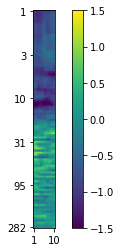

date:180330, rec:008, time:4237.0, label:0.0


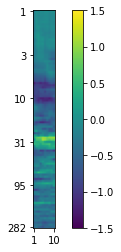

date:180414, rec:007, time:4828.0, label:0.0


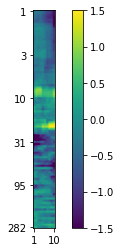

date:180325, rec:007, time:6833.0, label:0.0


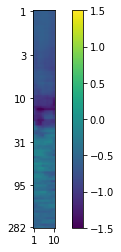

date:180331, rec:007, time:4717.0, label:0.0


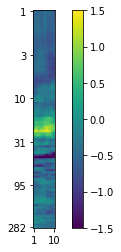

date:180414, rec:001, time:1760.0, label:0.0


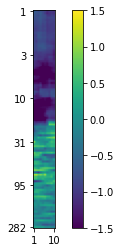

date:180413, rec:008, time:2629.0, label:1.0
date:180410, rec:004, time:110.0, label:1.0
date:180412, rec:005, time:2275.0, label:0.0


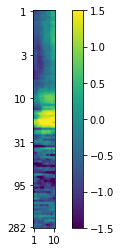

date:180330, rec:008, time:1661.0, label:0.0


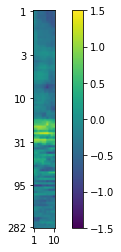

date:180330, rec:009, time:7111.0, label:0.0


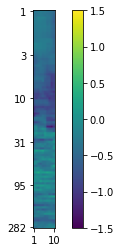

date:180322, rec:007, time:4060.0, label:0.0


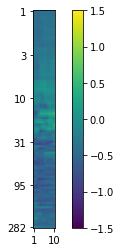

date:180323, rec:005, time:3421.0, label:1.0
date:180409, rec:006, time:7018.0, label:0.0


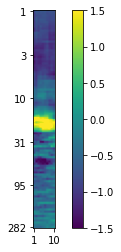

date:180413, rec:001, time:1290.0, label:0.0


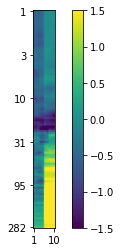

date:180409, rec:006, time:5078.0, label:0.0


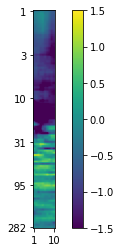

date:180411, rec:002, time:1670.0, label:1.0
date:180409, rec:006, time:5678.0, label:0.0


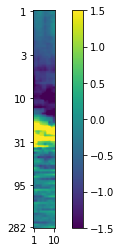

date:180411, rec:007, time:1868.0, label:0.0


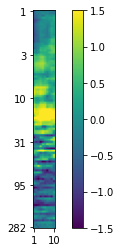

date:180413, rec:002, time:3470.0, label:0.0


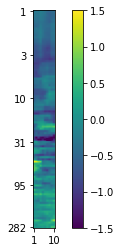

date:180414, rec:001, time:1480.0, label:0.0


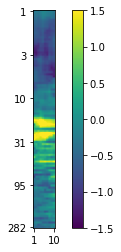

date:180324, rec:001, time:6309.0, label:1.0
date:180330, rec:007, time:2658.0, label:1.0
date:180325, rec:007, time:3809.0, label:0.0


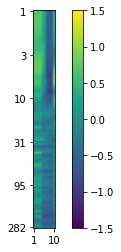

date:180323, rec:007, time:5461.0, label:0.0


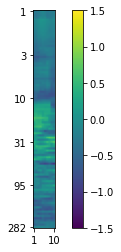

date:180324, rec:003, time:5958.0, label:1.0
date:180330, rec:001, time:1000.0, label:0.0


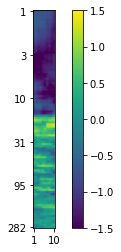

date:180329, rec:004, time:1693.0, label:1.0
date:180330, rec:004, time:4937.0, label:1.0
date:180410, rec:006, time:1846.0, label:1.0
date:180329, rec:006, time:5741.0, label:1.0
date:180414, rec:003, time:1613.0, label:1.0
date:180331, rec:007, time:2597.0, label:0.0


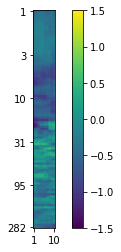

date:180327, rec:007, time:5721.0, label:0.0


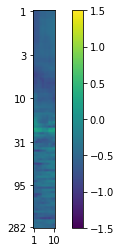

date:180327, rec:007, time:5401.0, label:0.0


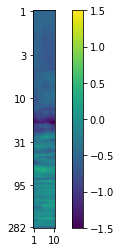

date:180331, rec:003, time:5728.0, label:1.0
date:180330, rec:001, time:6345.0, label:1.0
date:180323, rec:003, time:4010.0, label:1.0
date:180327, rec:008, time:3022.0, label:0.0


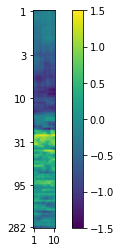

date:180329, rec:003, time:2194.0, label:1.0
date:180413, rec:001, time:890.0, label:0.0


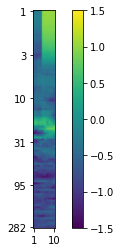

date:180413, rec:001, time:5987.0, label:0.0


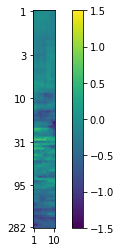

date:180412, rec:002, time:3827.0, label:1.0
date:180409, rec:004, time:5075.0, label:1.0
date:180414, rec:004, time:6265.0, label:1.0
date:180330, rec:003, time:5263.0, label:1.0
date:180327, rec:005, time:5958.0, label:0.0


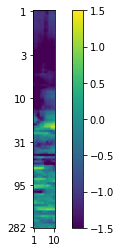

date:180323, rec:007, time:4321.0, label:0.0


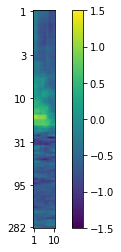

date:180413, rec:003, time:1893.0, label:0.0


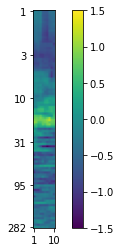

date:180322, rec:002, time:5224.0, label:1.0
date:180331, rec:007, time:2417.0, label:0.0


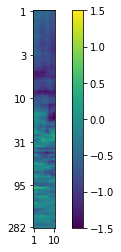

date:180410, rec:005, time:4917.0, label:1.0
date:180410, rec:002, time:2097.0, label:1.0
date:180330, rec:008, time:931.0, label:0.0


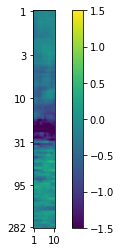

date:180413, rec:003, time:7021.0, label:0.0


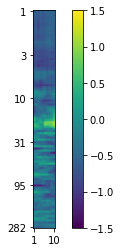

date:180327, rec:007, time:5721.0, label:0.0


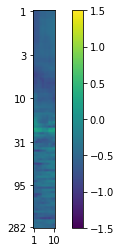

date:180327, rec:008, time:3442.0, label:0.0


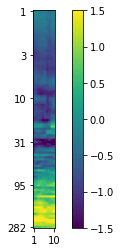

date:180327, rec:001, time:1860.0, label:0.0


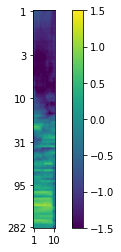

date:180413, rec:001, time:720.0, label:0.0


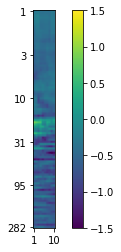

date:180327, rec:001, time:3654.0, label:1.0
date:180324, rec:008, time:2588.0, label:0.0


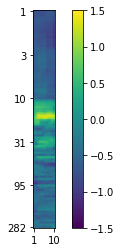

date:180331, rec:004, time:259.0, label:1.0
date:180330, rec:008, time:6715.0, label:0.0


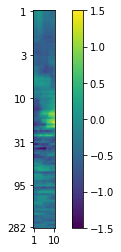

date:180413, rec:001, time:3090.0, label:0.0


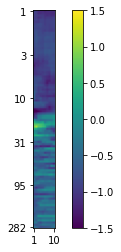

date:180331, rec:007, time:4957.0, label:0.0


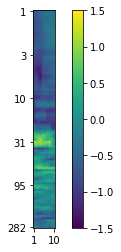

date:180413, rec:002, time:4811.0, label:0.0


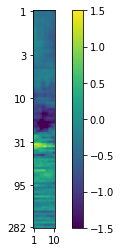

date:180327, rec:007, time:1980.0, label:0.0


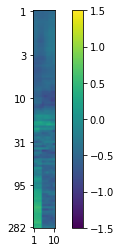

date:180325, rec:006, time:4105.0, label:1.0
date:180412, rec:006, time:5458.0, label:0.0


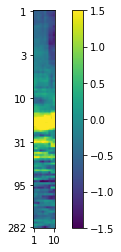

date:180401, rec:001, time:6103.0, label:1.0
date:180330, rec:005, time:482.0, label:1.0
date:180325, rec:004, time:683.0, label:1.0
date:180330, rec:008, time:1994.0, label:1.0
date:180410, rec:003, time:6024.0, label:1.0
date:180330, rec:009, time:3094.0, label:1.0
date:180329, rec:004, time:1663.0, label:1.0
date:180411, rec:006, time:1658.0, label:1.0
date:180327, rec:001, time:3934.0, label:1.0
date:180327, rec:001, time:1860.0, label:0.0


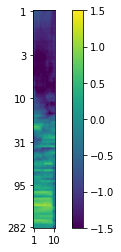

date:180413, rec:004, time:5201.0, label:1.0
date:180414, rec:001, time:630.0, label:0.0


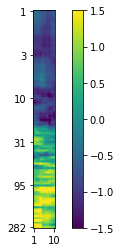

date:180325, rec:002, time:5078.0, label:1.0
date:180413, rec:001, time:5756.0, label:0.0


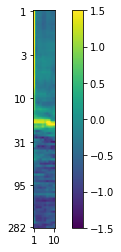

date:180409, rec:006, time:5078.0, label:0.0


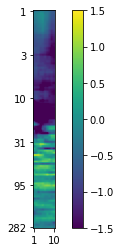

date:180401, rec:001, time:5297.0, label:0.0


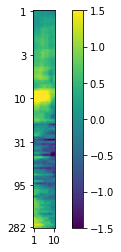

date:180324, rec:003, time:530.0, label:1.0
date:180327, rec:004, time:6353.0, label:1.0
date:180329, rec:001, time:780.0, label:0.0


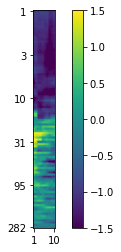

date:180322, rec:005, time:6654.0, label:1.0
date:180413, rec:002, time:400.0, label:0.0


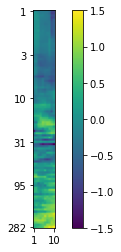

date:180410, rec:004, time:5449.0, label:1.0
date:180327, rec:007, time:1180.0, label:0.0


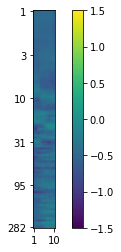

date:180325, rec:007, time:1603.0, label:1.0
date:180325, rec:002, time:600.0, label:1.0
date:180327, rec:008, time:5013.0, label:0.0


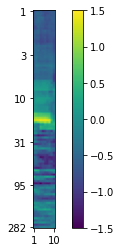

date:180327, rec:004, time:1370.0, label:1.0
date:180327, rec:001, time:2545.0, label:1.0
date:180414, rec:004, time:5785.0, label:1.0
date:180414, rec:001, time:5913.0, label:1.0
date:180413, rec:001, time:6797.0, label:0.0


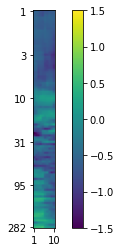

date:180325, rec:009, time:2716.0, label:1.0
date:180413, rec:002, time:1750.0, label:0.0


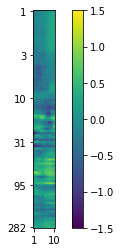

date:180414, rec:001, time:650.0, label:0.0


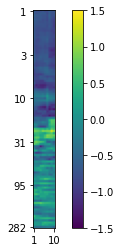

date:180413, rec:004, time:80.0, label:0.0


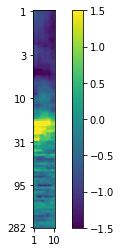

date:180323, rec:007, time:2825.0, label:0.0


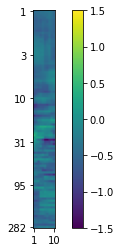

date:180329, rec:003, time:1828.0, label:1.0
date:180325, rec:007, time:6933.0, label:0.0


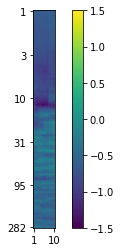

date:180413, rec:004, time:640.0, label:0.0


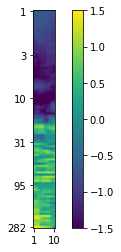

date:180413, rec:002, time:180.0, label:0.0


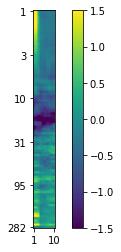

date:180324, rec:008, time:631.0, label:1.0
date:180412, rec:001, time:845.0, label:0.0


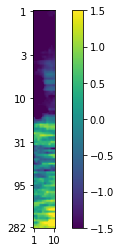

date:180413, rec:002, time:1210.0, label:0.0


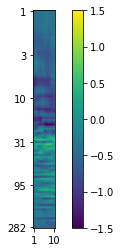

date:180413, rec:002, time:5081.0, label:0.0


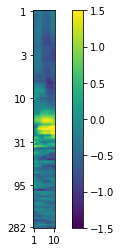

date:180414, rec:007, time:5338.0, label:0.0


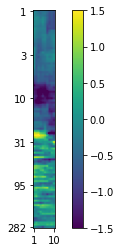

date:180412, rec:005, time:4329.0, label:0.0


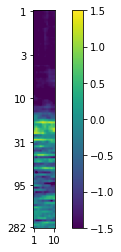

date:180414, rec:001, time:3854.0, label:0.0


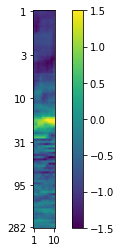

date:180324, rec:004, time:2639.0, label:1.0
date:180413, rec:002, time:4111.0, label:0.0


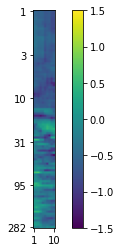

date:180327, rec:005, time:4330.0, label:1.0
date:180413, rec:003, time:5198.0, label:0.0


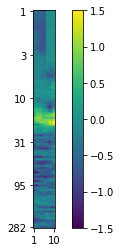

date:180409, rec:006, time:6368.0, label:0.0


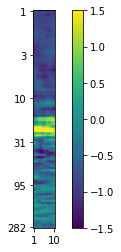

date:180410, rec:006, time:1636.0, label:1.0
date:180327, rec:006, time:6251.0, label:1.0
date:180327, rec:001, time:300.0, label:0.0


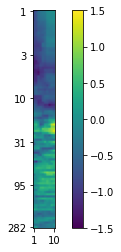

date:180327, rec:007, time:1980.0, label:0.0


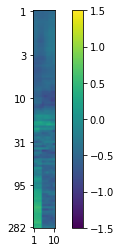

date:180329, rec:004, time:5671.0, label:1.0
date:180413, rec:004, time:4174.0, label:1.0
date:180325, rec:001, time:3780.0, label:1.0


In [27]:
# movement labelled 0; non-movement labelled 1
for batch_idx, (data, label, date, rec, time) in enumerate(train_loader):
    for i in range(128):
        print('date:{}, rec:{}, time:{}, label:{}'.format(date[i], rec[i], time[i], label[i][0].numpy()))
        if label[i][0].numpy() == 0.0:
            data_sub = data[i][0]
            plt.yticks(ticks=[0, 20, 40, 60, 80, 99], labels=[round(np.logspace(0, 2.45, 100)[i]) for i in [0, 20, 40, 60, 80, 99]])
            plt.xticks(ticks=[0, 9], labels=[1, 10])
            plt.imshow(data_sub)
            plt.clim(-1.5, 1.5)
            plt.colorbar()
            plt.show()
    break

In [28]:
class MLP(nn.Module): # add dropo
    def __init__(self, input_dim=100*10*62, output_dim=1, embed_dim=256,drop_prob=0.):
        super(MLP, self).__init__()
        self.linear1 = nn.Linear(input_dim, embed_dim)
        self.linear2 = nn.Linear(embed_dim, output_dim)
        self.dropout = nn.Dropout(drop_prob)
        
    def forward(self, x):
        
        x = x.reshape([x.shape[0], 1, -1]).float()
        x = self.dropout(F.relu(self.linear1(x)))
        outputs = self.linear2(x)
        
        return outputs

In [29]:
device = torch.device('cuda')

tol = 0.01
learning_rate = 0.001
num_epochs = 51
alpha = 0
model_type = 'MLP'
loss_type = 'bce'
reg_type = 'none'
input_dim = 62*10*100
embed_dim = 256

dropout_all = [0.1,0.3,0.5,0.7,0.9,1]





dropout:  0.1
Train loss for epoch 0: 4.321807384490967
Val loss for epoch 0: 2.529698133468628
Train loss for epoch 1: 0.6897027492523193
Val loss for epoch 1: 0.902279257774353
1
Train loss for epoch 2: 0.16562402248382568
Val loss for epoch 2: 0.9914610385894775
Train loss for epoch 3: 0.13925834000110626
Val loss for epoch 3: 2.133293628692627
Train loss for epoch 4: 0.17290149629116058
Val loss for epoch 4: 2.842184543609619
Train loss for epoch 5: 0.13499046862125397
Val loss for epoch 5: 3.1936943531036377
Train loss for epoch 6: 0.15132156014442444
Val loss for epoch 6: 2.1797406673431396
Train loss for epoch 7: 0.16986940801143646
Val loss for epoch 7: 2.449506998062134
Train loss for epoch 8: 0.21046099066734314
Val loss for epoch 8: 5.8915557861328125
Train loss for epoch 9: 0.21866944432258606
Val loss for epoch 9: 9.070435523986816
Train loss for epoch 10: 0.19980309903621674
Val loss for epoch 10: 6.753004550933838
Train loss for epoch 11: 0.23374143242835999
Val loss for

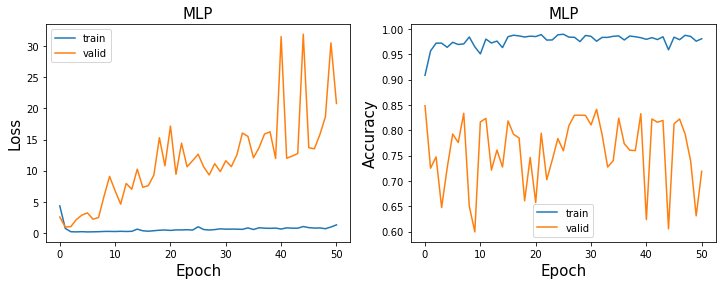

dropout:  0.3
Train loss for epoch 0: 3.6728978157043457
Val loss for epoch 0: 2.947397470474243
Train loss for epoch 1: 0.9137821197509766
Val loss for epoch 1: 1.589604139328003
1
Train loss for epoch 2: 0.32935094833374023
Val loss for epoch 2: 2.1490414142608643
Train loss for epoch 3: 0.2798968553543091
Val loss for epoch 3: 1.5093042850494385
3
Train loss for epoch 4: 0.3357302248477936
Val loss for epoch 4: 2.9585232734680176
Train loss for epoch 5: 0.3429064154624939
Val loss for epoch 5: 3.809556484222412
Train loss for epoch 6: 0.4618823528289795
Val loss for epoch 6: 6.0700459480285645
Train loss for epoch 7: 0.5658782124519348
Val loss for epoch 7: 5.175074577331543
Train loss for epoch 8: 0.5937324166297913
Val loss for epoch 8: 4.7917962074279785
Train loss for epoch 9: 0.6605058908462524
Val loss for epoch 9: 6.47102165222168
Train loss for epoch 10: 0.7391046285629272
Val loss for epoch 10: 5.376176834106445
Train loss for epoch 11: 0.9323979020118713
Val loss for epoch

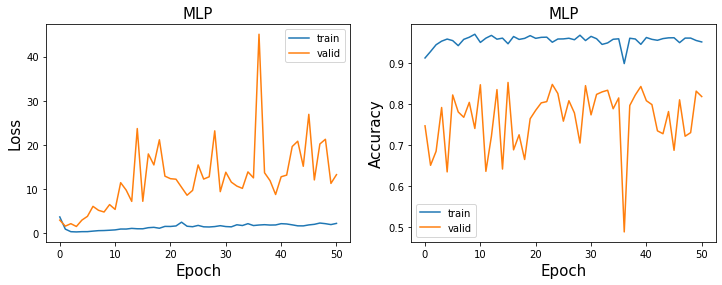

dropout:  0.5
Train loss for epoch 0: 4.639547824859619
Val loss for epoch 0: 2.858887195587158
Train loss for epoch 1: 3.5373919010162354
Val loss for epoch 1: 3.7722301483154297
Train loss for epoch 2: 3.681469202041626
Val loss for epoch 2: 3.169400215148926
Train loss for epoch 3: 3.6746304035186768
Val loss for epoch 3: 3.6258773803710938
Train loss for epoch 4: 3.743229389190674
Val loss for epoch 4: 6.033565998077393
Train loss for epoch 5: 4.187596321105957
Val loss for epoch 5: 5.384359836578369
Train loss for epoch 6: 4.006712913513184
Val loss for epoch 6: 4.823037147521973
Train loss for epoch 7: 3.784550666809082
Val loss for epoch 7: 4.645503997802734
Train loss for epoch 8: 3.8041982650756836
Val loss for epoch 8: 4.620209217071533
Train loss for epoch 9: 3.857088327407837
Val loss for epoch 9: 6.6249308586120605
Train loss for epoch 10: 3.7710351943969727
Val loss for epoch 10: 7.0416364669799805
Train loss for epoch 11: 3.5432941913604736
Val loss for epoch 11: 5.42243

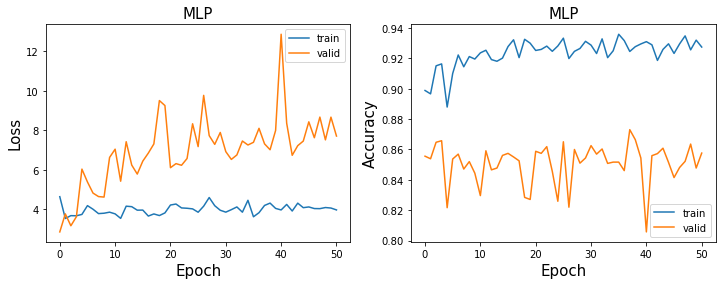

dropout:  0.7
Train loss for epoch 0: 6.004515171051025
Val loss for epoch 0: 2.6410269737243652
Train loss for epoch 1: 4.276597499847412
Val loss for epoch 1: 2.871354818344116
Train loss for epoch 2: 4.4018049240112305
Val loss for epoch 2: 3.233060836791992
Train loss for epoch 3: 4.524013996124268
Val loss for epoch 3: 4.919925212860107
Train loss for epoch 4: 4.582155227661133
Val loss for epoch 4: 3.8408708572387695
Train loss for epoch 5: 4.793707847595215
Val loss for epoch 5: 4.606414794921875
Train loss for epoch 6: 4.582176208496094
Val loss for epoch 6: 4.404018402099609
Train loss for epoch 7: 4.6906843185424805
Val loss for epoch 7: 4.338442802429199
Train loss for epoch 8: 4.862057209014893
Val loss for epoch 8: 4.088107585906982
Train loss for epoch 9: 4.680881023406982
Val loss for epoch 9: 4.3025288581848145
Train loss for epoch 10: 4.647753715515137
Val loss for epoch 10: 5.092259883880615
Train loss for epoch 11: 4.845677375793457
Val loss for epoch 11: 4.354813098

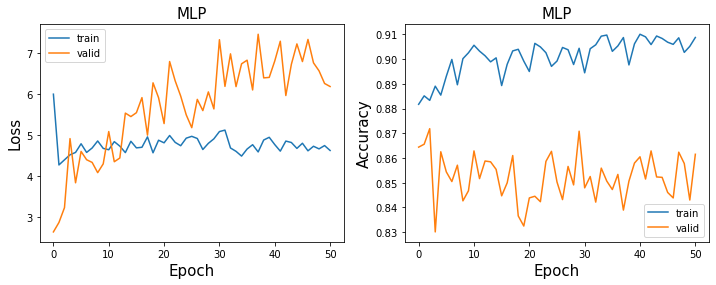

dropout:  0.9
Train loss for epoch 0: 16.54262351989746
Val loss for epoch 0: 15.347357749938965
Train loss for epoch 1: 11.471658706665039
Val loss for epoch 1: 4.477860450744629
1
Train loss for epoch 2: 7.193135738372803
Val loss for epoch 2: 3.69429874420166
2
Train loss for epoch 3: 6.783859729766846
Val loss for epoch 3: 4.288204193115234
Train loss for epoch 4: 6.905246734619141
Val loss for epoch 4: 4.068172454833984
Train loss for epoch 5: 6.7588324546813965
Val loss for epoch 5: 3.6876072883605957
5
Train loss for epoch 6: 6.632122039794922
Val loss for epoch 6: 3.691594123840332
Train loss for epoch 7: 6.5592122077941895
Val loss for epoch 7: 3.757385730743408
Train loss for epoch 8: 6.712124824523926
Val loss for epoch 8: 3.9697864055633545
Train loss for epoch 9: 6.420704364776611
Val loss for epoch 9: 3.917943000793457
Train loss for epoch 10: 6.6142120361328125
Val loss for epoch 10: 5.521188259124756
Train loss for epoch 11: 6.583568096160889
Val loss for epoch 11: 4.06

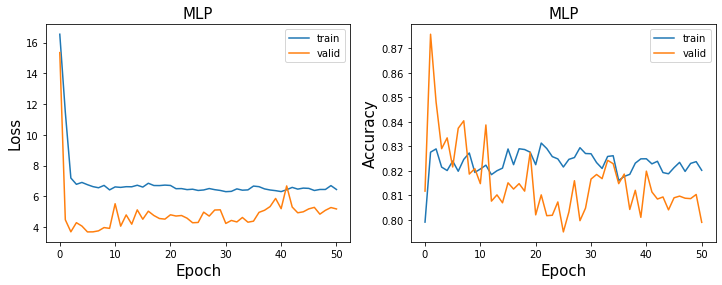

dropout:  1
Train loss for epoch 0: 0.6882888674736023
Val loss for epoch 0: 0.7948687076568604
Train loss for epoch 1: 0.6875633597373962
Val loss for epoch 1: 0.7965982556343079
Train loss for epoch 2: 0.6875735521316528
Val loss for epoch 2: 0.7959397435188293
Train loss for epoch 3: 0.687567949295044
Val loss for epoch 3: 0.7951110601425171
Train loss for epoch 4: 0.6875618696212769
Val loss for epoch 4: 0.7917615175247192
4
Train loss for epoch 5: 0.687567949295044
Val loss for epoch 5: 0.8000705242156982
Train loss for epoch 6: 0.6875618100166321
Val loss for epoch 6: 0.8023928999900818
Train loss for epoch 7: 0.6875765323638916
Val loss for epoch 7: 0.7996427416801453
Train loss for epoch 8: 0.6875723600387573
Val loss for epoch 8: 0.7942007780075073
Train loss for epoch 9: 0.6875690817832947
Val loss for epoch 9: 0.7934384346008301
Train loss for epoch 10: 0.6875684261322021
Val loss for epoch 10: 0.7978295087814331
Train loss for epoch 11: 0.687572181224823
Val loss for epoch 

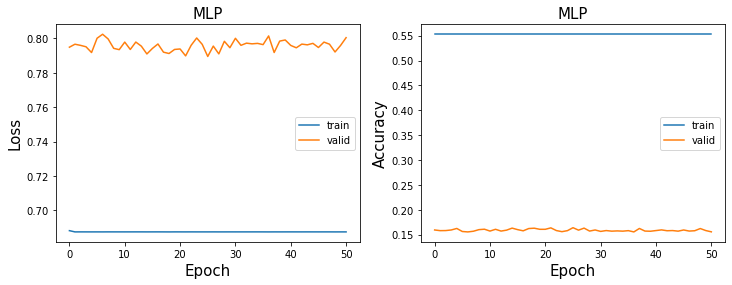

In [68]:


for d in range(0,len(dropout_all)):
    dropout = dropout_all[d]
    model = MLP(input_dim=input_dim, embed_dim=embed_dim,drop_prob = dropout).to(device)
    (data, labels, _, _, _) = next(iter(train_loader))
    data = data.to(device)
    output = model(data)
    output.shape
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
    print('dropout: ', dropout)

    epochs, training_losses, training_acc, val_losses, validation_acc = [], [], [], [], []

    for epoch in range(num_epochs):
        train_loss, train_acc = train(model, optimizer, train_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, 
                                      reg_type=reg_type, collect_result=False, device=device)
        print('Train loss for epoch {}: {}'.format(epoch, train_loss))
        val_loss, val_acc = evaluate(model, optimizer, val_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, 
                                     reg_type=reg_type, collect_result=False, device=device)
        print('Val loss for epoch {}: {}'.format(epoch, val_loss))
        if epoch == 0:
            torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_DO{}_EMBED{}_EPOCH{}_MODEL_{}.pt'.format(
                    save_path, model_type, CH, loss_type, reg_type, alpha, dropout, embed_dim, epoch,model_name))
        if val_losses:
            if val_loss < min(val_losses):
                best_epoch = epoch
                print(epoch)
                torch.save(model.state_dict(), '{}/{}_CH{}_LOSS{}_REG{}{}_DO{}_EMBED{}_EPOCH{}_MODEL_{}.pt'.format(
                    save_path, model_type, CH, loss_type, reg_type, alpha, dropout, embed_dim, epoch,model_name))
        epochs.append(epoch)
        training_losses.append(train_loss)
        training_acc.append(train_acc)
        val_losses.append(val_loss)
        validation_acc.append(val_acc)

        if train_loss < tol:
            break
    plot_loss_acc(training_losses, val_losses, training_acc, validation_acc, model_type)



In [31]:
model_MLP = os.listdir(save_path)
results = []
for x in range(0,len(model_MLP)):
    result = model_MLP[x].split('_') 
    channel = [i for i,item in enumerate(np.array(result)) if "CHall" in item]
    if not(channel):
        continue
    else:
        model_dropout = [i for i,item in enumerate(np.array(result)) if "DO" in item]
        if not(model_dropout):
            continue
        else:
            dropout = [int(i) for i in result[model_dropout[0]] if i.isdigit()]
            if len(dropout) ==2:
                dropout = dropout[1]/10
            else:
                dropout = dropout[0]
            epoch_name = [i for i,item in enumerate(np.array(result)) if "EPOCH" in item]
            res = [int(i) for i in result[epoch_name[0]] if i.isdigit()]
            if len(res) > 1:
                epoch_result = res[0]*10+res[1]
            else:
                epoch_result = res[0]
            results.append([dropout, epoch_result])

results = pd.DataFrame(np.array(results), columns=['dropout', 'epoch'])
best_results = results.groupby('dropout').max('epoch')
print(best_results)

         epoch
dropout       
0.1        1.0
0.3        3.0
0.5        0.0
0.7        0.0
0.9        5.0
1.0       25.0


/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.1_EPOCH1.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


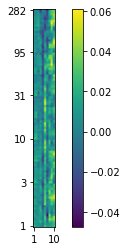

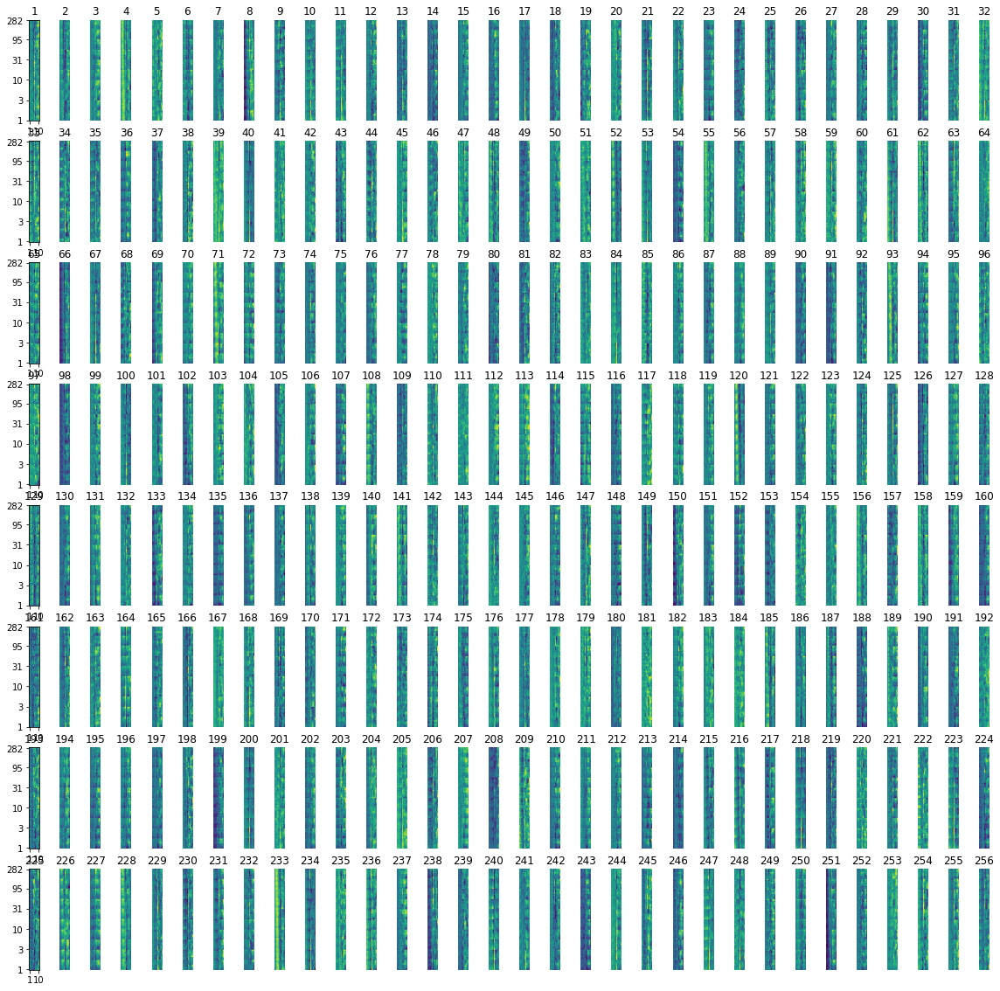

test loss:0.7895373106002808 accuracy:0.823045267489712


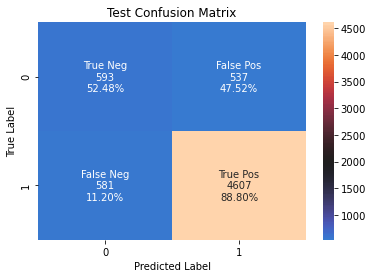

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.3_EPOCH3.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


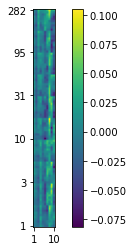

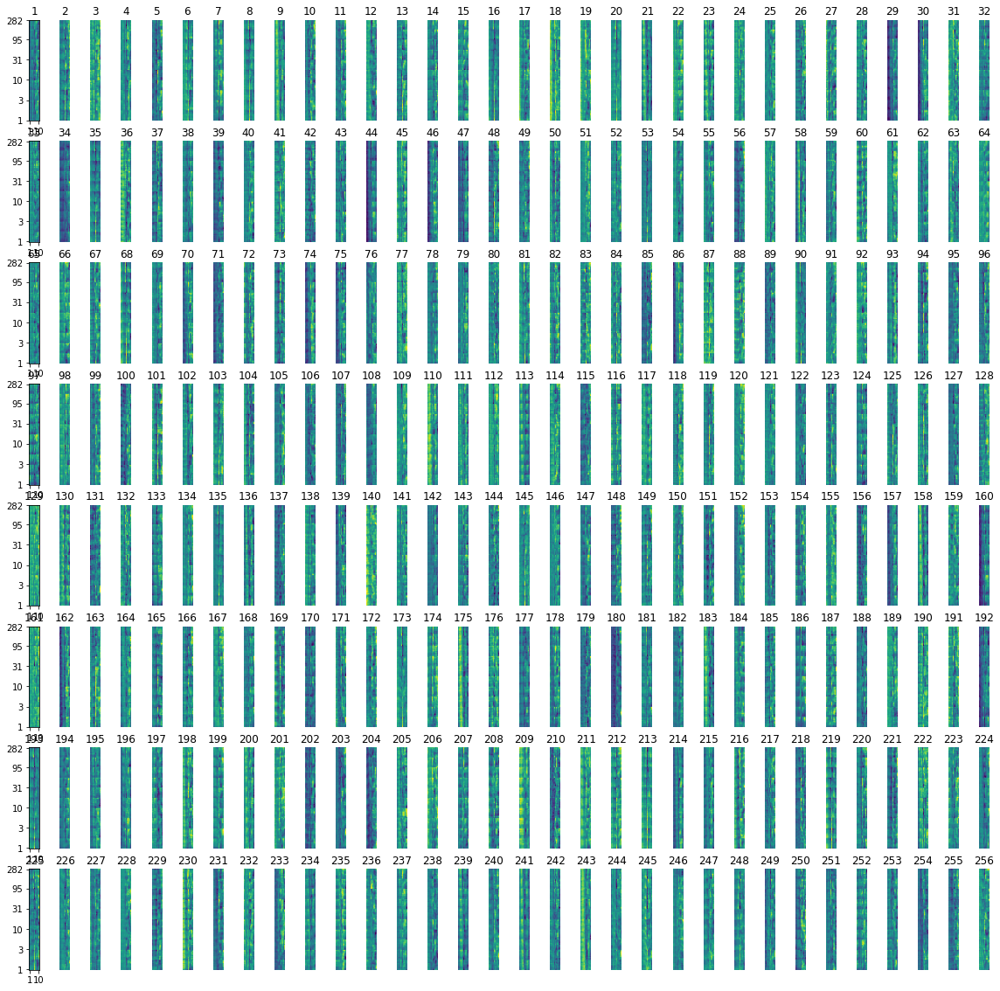

test loss:1.8233486413955688 accuracy:0.8526432415321304


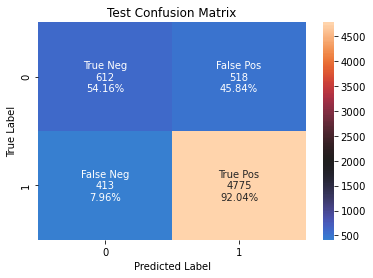

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.5_EPOCH0.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


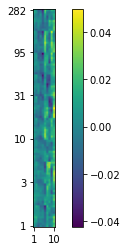

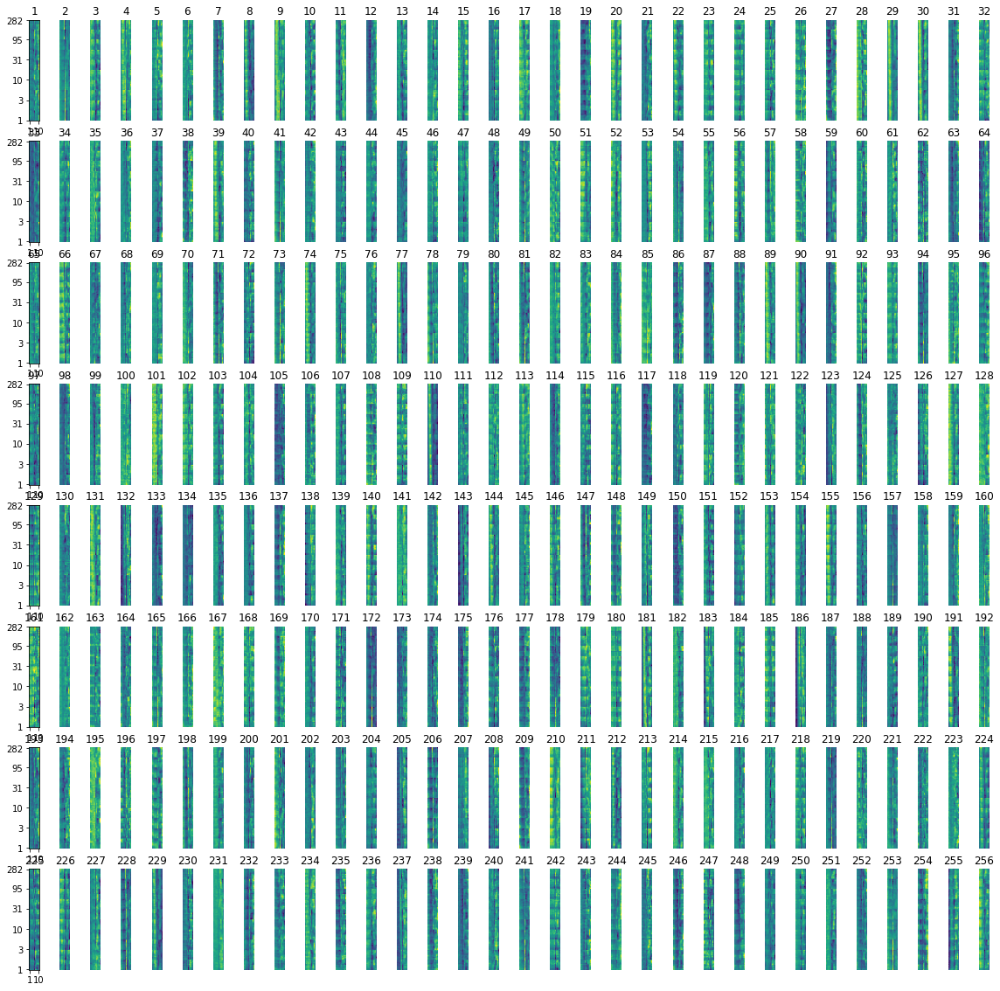

test loss:2.815023899078369 accuracy:0.8452041785375118


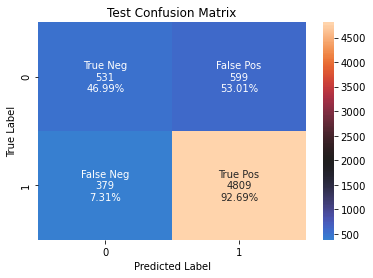

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.7_EPOCH0.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


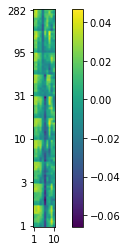

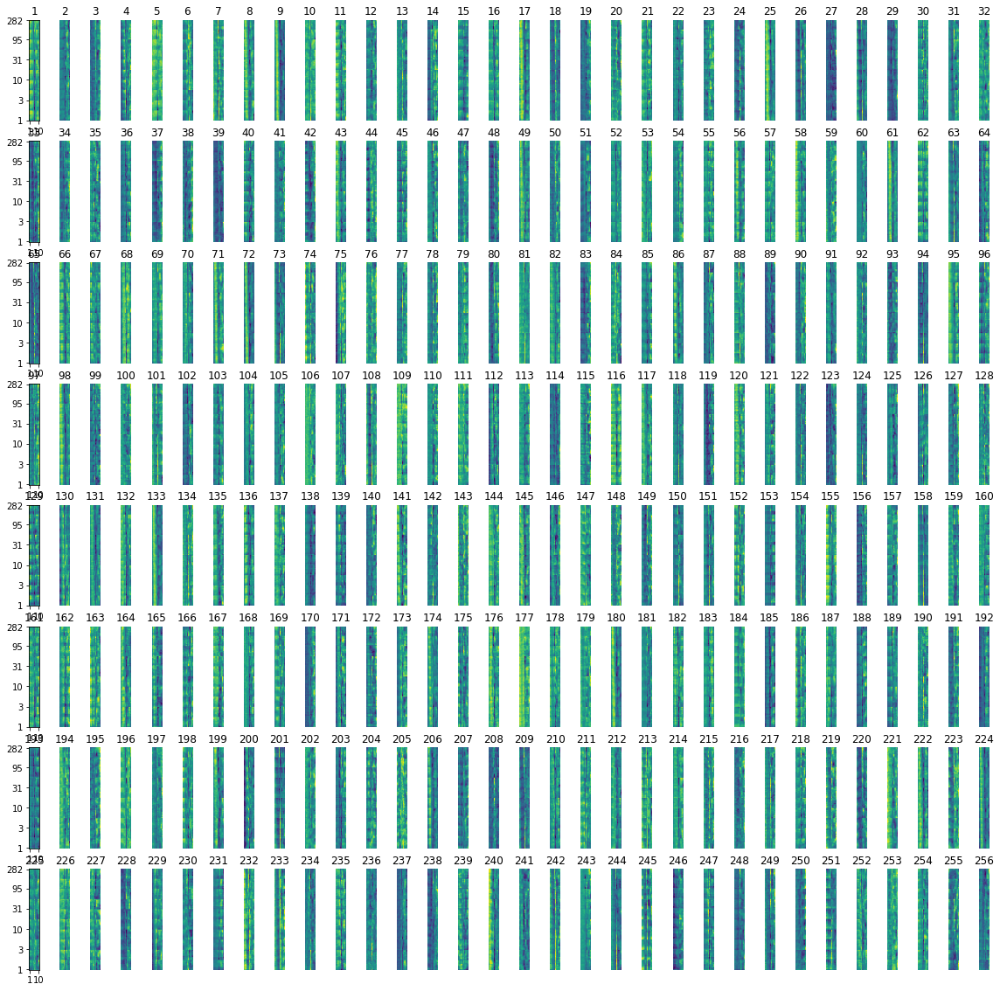

test loss:2.9383544921875 accuracy:0.8589743589743589


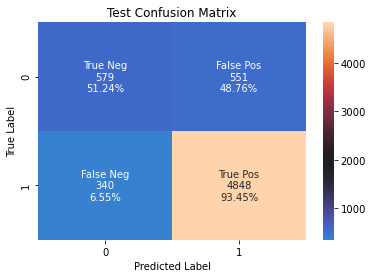

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.9_EPOCH5.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


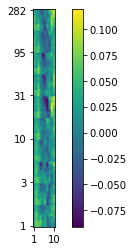

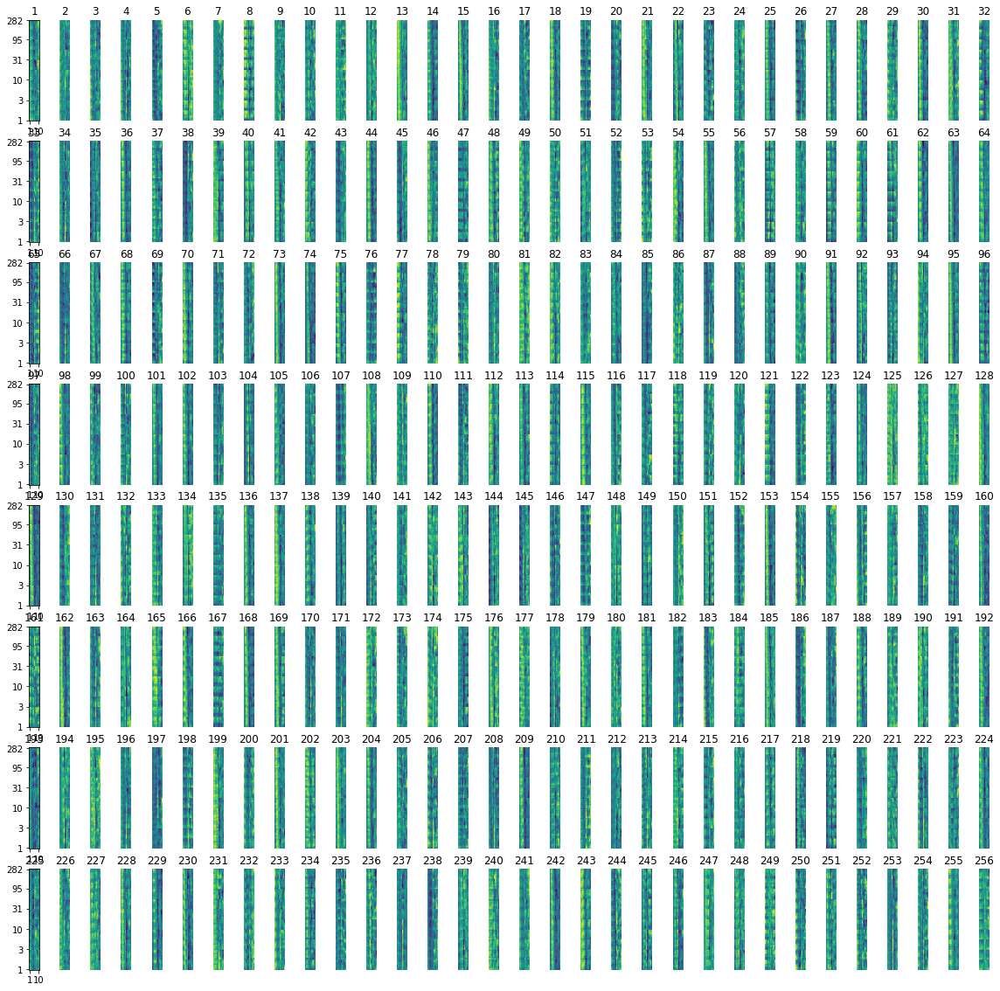

test loss:4.62537145614624 accuracy:0.8380816714150048


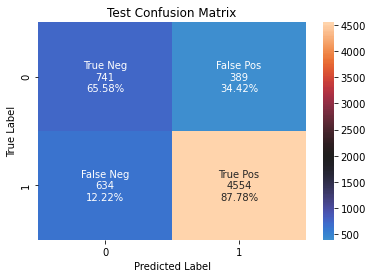

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO1_EPOCH25.pt
torch.Size([256, 62000])
torch.Size([256, 62, 10, 100]) torch.Size([1, 256])
(10, 100)
One feature


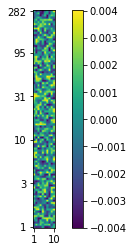

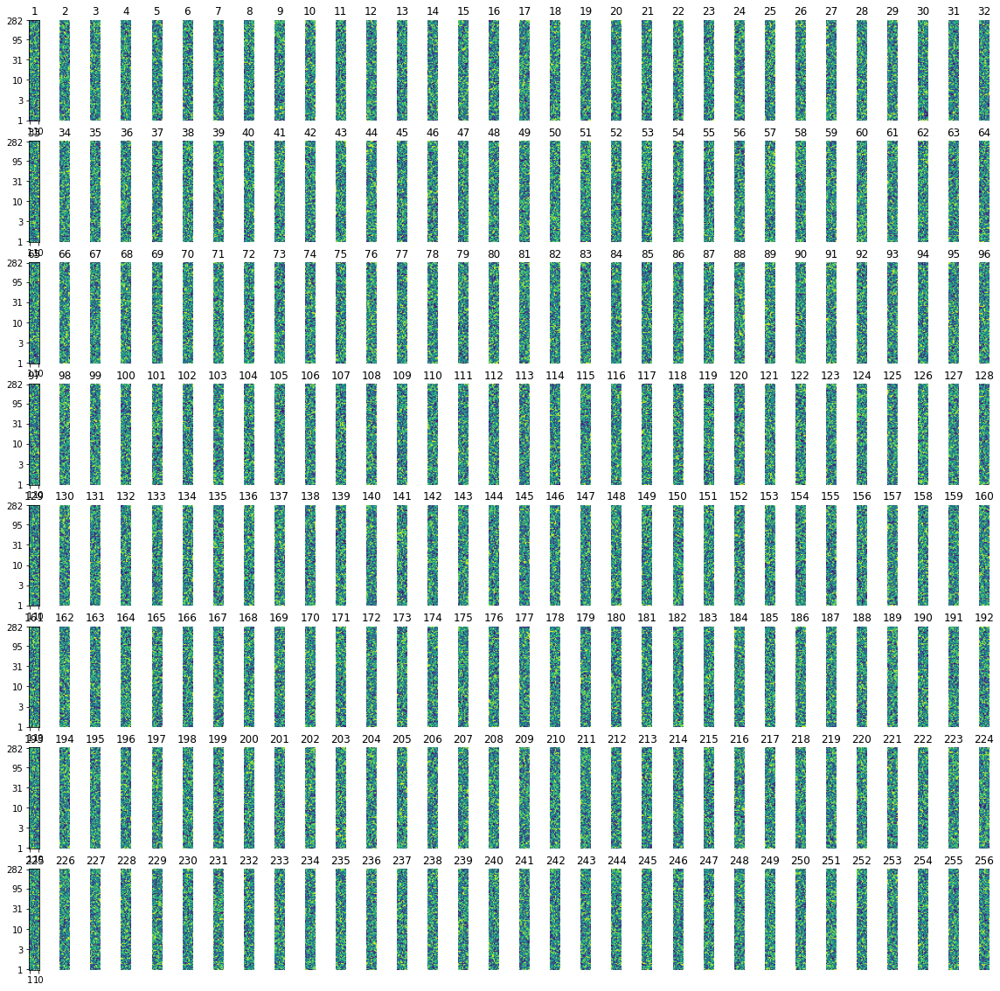

test loss:0.7800223231315613 accuracy:0.21193415637860083


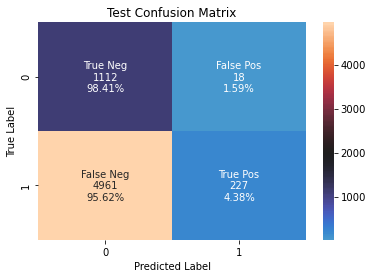

In [32]:
for i,(index,row) in enumerate(best_results.iterrows()):
    model = MLP().to(device)
    path = save_path
    if index == 1.0:
        index = 1
    DO = index
    best_epoch = int(row)
    ## Load best model
    model = MLP(input_dim=input_dim, embed_dim=embed_dim).to(device)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_DO{}_EMBED{}_EPOCH{}_MODEL_{}.pt'.format(
    save_path, model_type, CH, loss_type, reg_type, alpha, DO, embed_dim, best_epoch,model_name)))
    print('{}/{}_CH{}_LOSS{}_REG{}{}_DO{}_EPOCH{}.pt'.format(path, model_type, CH, loss_type, reg_type, alpha,DO, best_epoch))
    
    # Print Shape
    w1 = model.linear1.weight
    print(w1.shape)
    w1 = model.linear1.weight.view(256,62,10,100)
    w2 = model.linear2.weight
    print(w1.shape, w2.shape)
    w1 = w1.detach().cpu().numpy()
    w2 = w2.detach().cpu().numpy()
    print(w1[0][0].shape)
    
    # Print feature
    print('One feature')
    plt.yticks(ticks=[0, 20, 40, 60, 80, 99], labels=[round(np.logspace(0, 2.45, 100)[i]) for i in [0, 20, 40, 60, 80, 99]])
    plt.xticks(ticks=[0, 9], labels=[1, 10])
    plt.imshow(w1[0][0].transpose(),origin='lower')
    # plt.clim(-1.5, 1.5)
    plt.colorbar()
    plt.show()
    
    # All features
    timewindow = 10
    plt.figure(figsize=(20,20))
    ylabels_list = [0,32,64,96,128,160,192,224,256] 
    for i in range(256):
        weights_sub = w1[i]
        plt.subplot(8,32,i+1)
        if i in ylabels_list:
            plt.yticks(ticks=[0, 20, 40, 60, 80, 99], labels=[round(np.logspace(0, 2.45, 100)[i]) for i in [0, 20, 40, 60, 80, 99]])
            plt.xticks(ticks=[0, timewindow-1], labels=[1, timewindow])
        else:
            plt.axis('off')
    #     plt.imshow(weights_sub)
        plt.imshow(w1[i][0].transpose(),origin='lower')
        plt.title(str(i+1))
    plt.show()
    
    
    ## Calculate accuracy and test loss
    test_loss, test_acc, test_preds, test_preds_probs, test_labels,_,_,_, cases_wrong_0 = evaluate(model, optimizer, test_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
    print('test loss:{} accuracy:{}'.format(test_loss, test_acc))
    
    ## Confusion matrix
    predictions_test = np.concatenate(test_preds)
    labels_test = np.concatenate(test_labels)

    df_test = pd.DataFrame({'predictions': predictions_test, 'labels': labels_test})

    cm_test = confusion_matrix(labels_test, predictions_test)
    ax = plt.axes()
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                    cm_test.flatten()]

    TNR = int(group_counts[0]) / (int(group_counts[0])+int(group_counts[1]))
    FPR = 1 - TNR
    TPR = int(group_counts[3]) / (int(group_counts[3])+int(group_counts[2]))
    FNR = 1-TPR
    group_percentages =[TNR, FPR, FNR, TPR]

    group_percentages = ["{0:.2%}".format(value) for value in
                         group_percentages]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sn.heatmap(cm_test, annot=labels, fmt='', center = 2000)
    ax.set_title('Test Confusion Matrix')
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    plt.show()
    


/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.1_EPOCH1.pt
val loss:0.902279257774353, val accuracy:0.725050916496945, val percentage postive:0.8616768717765808


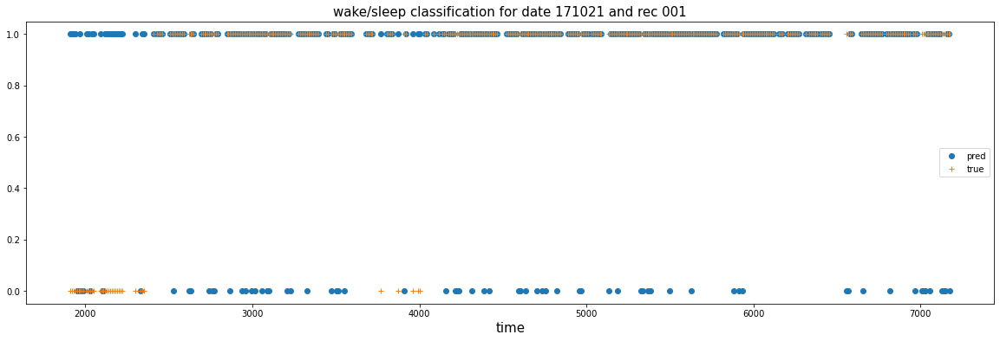

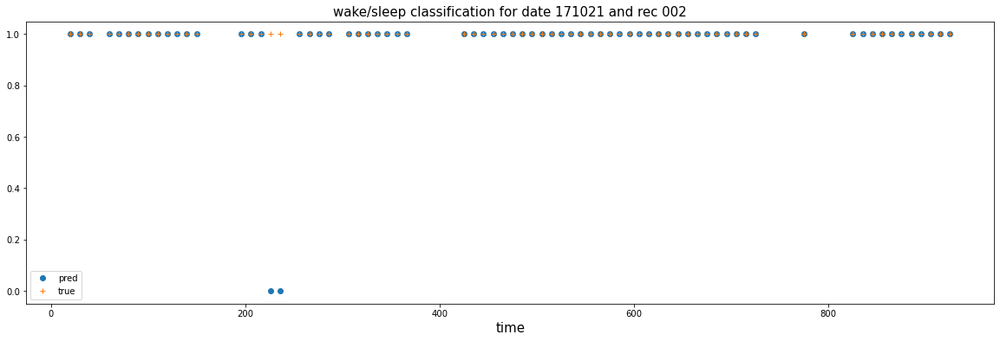

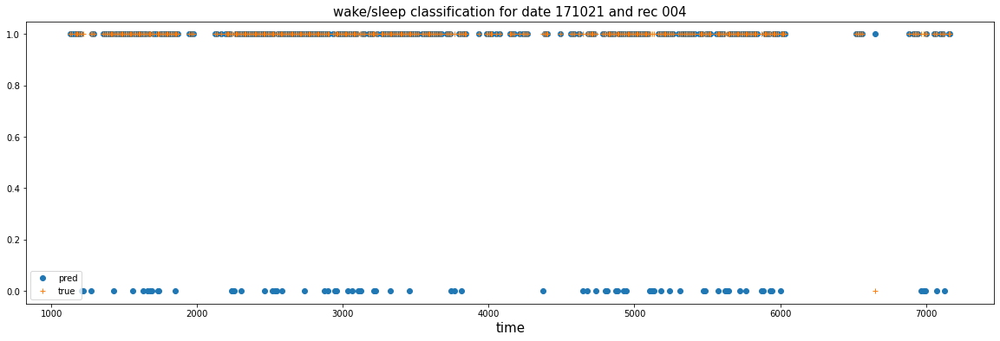

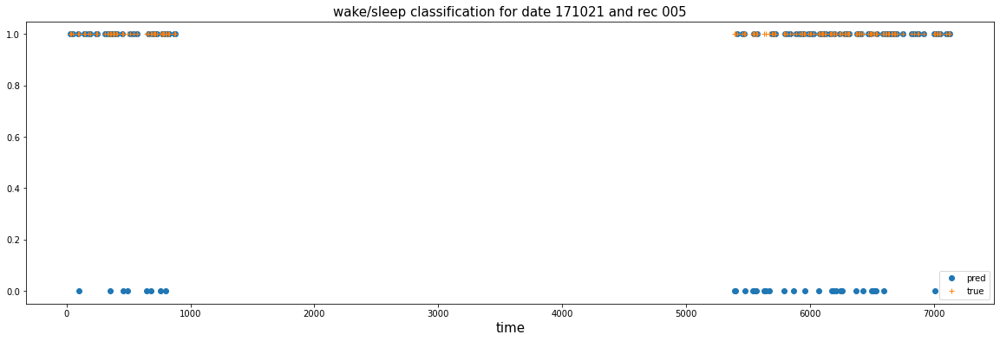

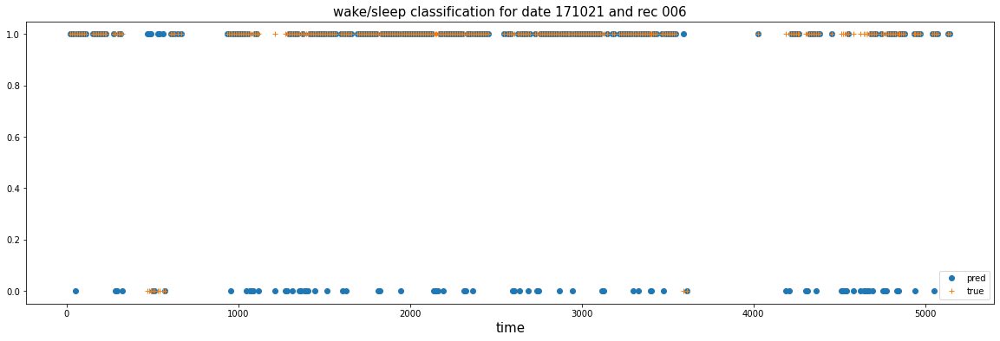

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.3_EPOCH3.pt
val loss:1.5093042850494385, val accuracy:0.7922606924643585, val percentage postive:0.8616768717765808


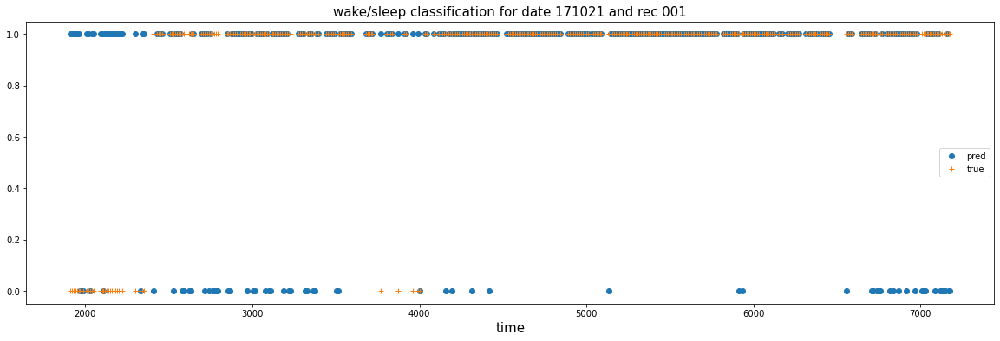

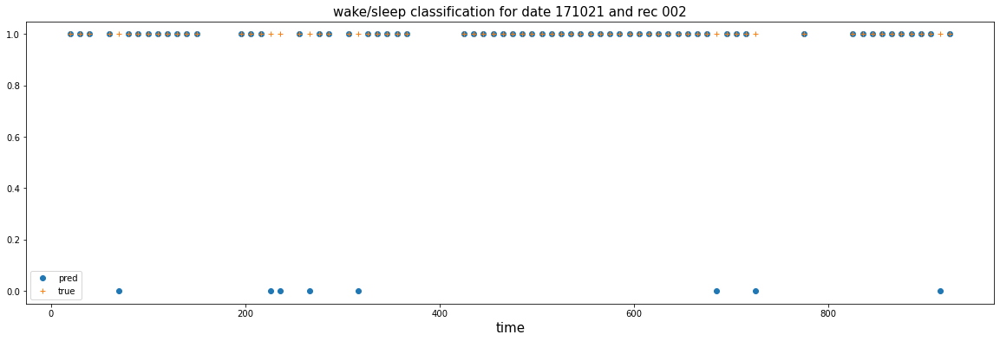

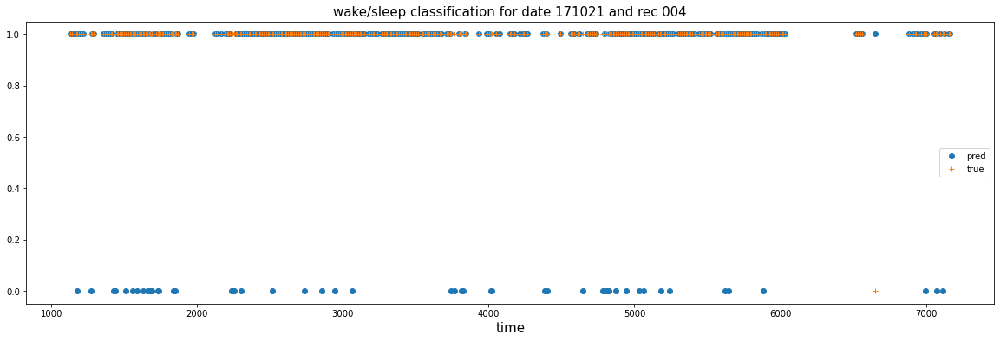

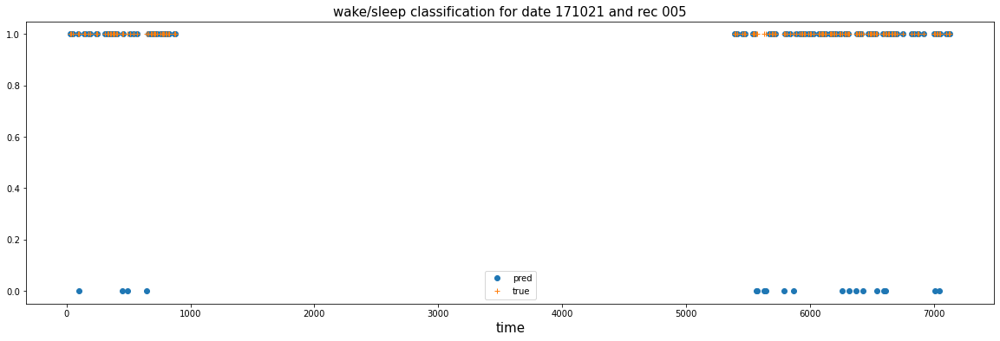

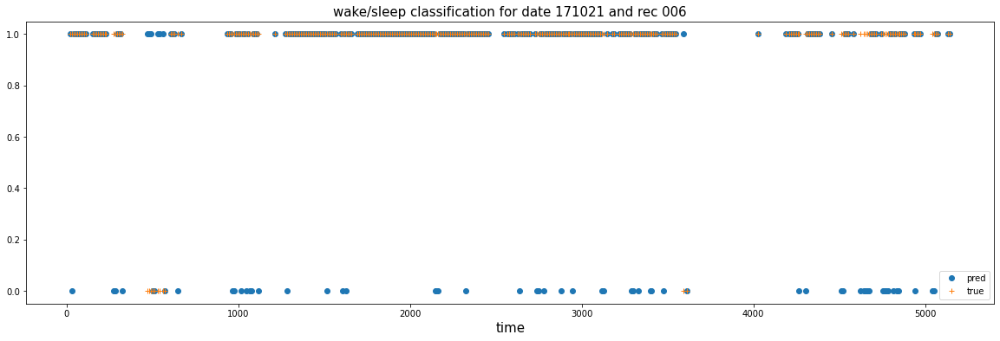

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.5_EPOCH0.pt
val loss:2.858887195587158, val accuracy:0.8555668703326544, val percentage postive:0.8616768717765808


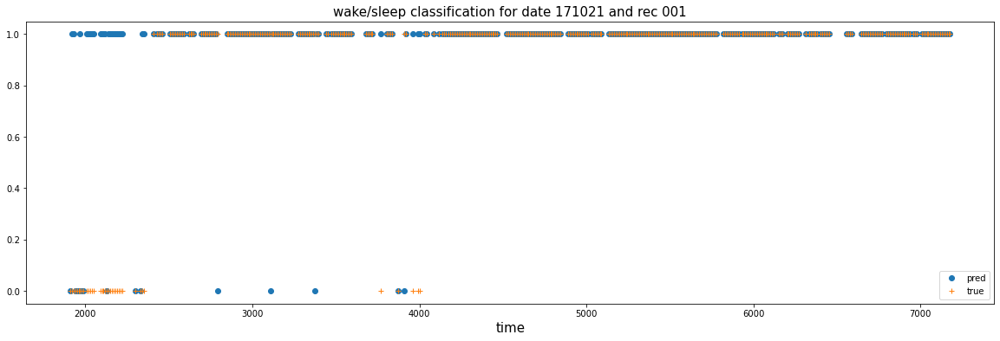

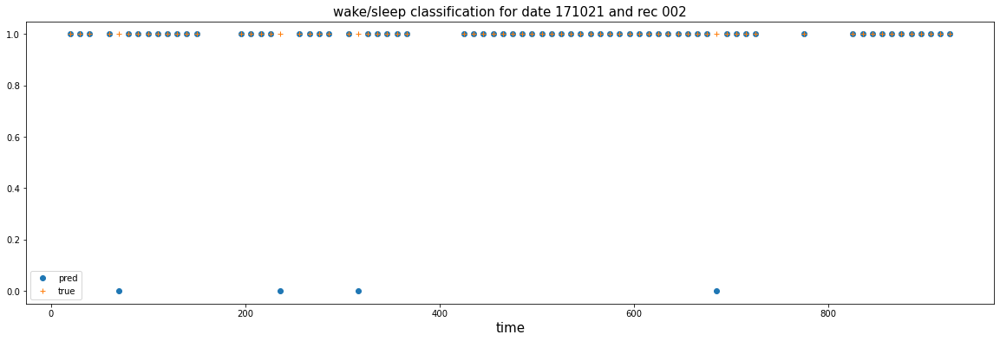

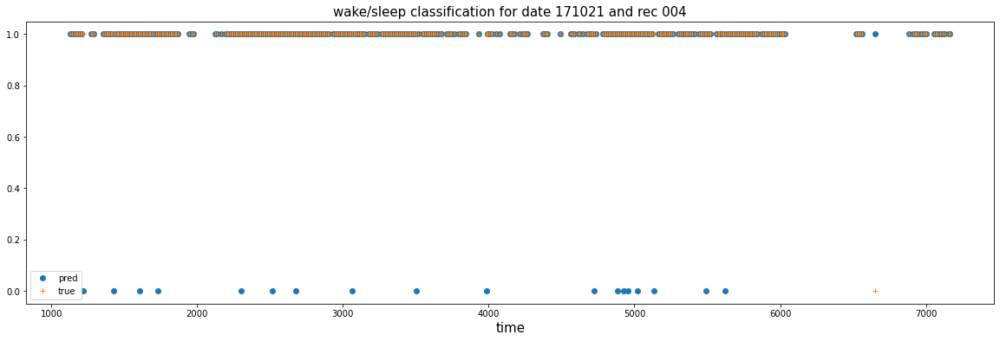

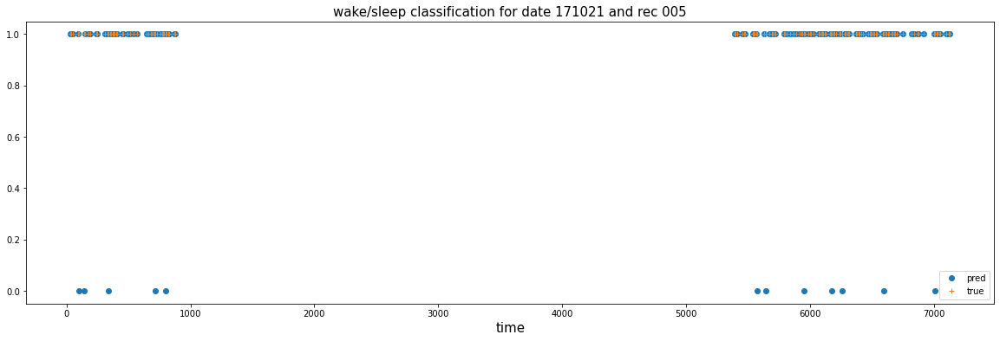

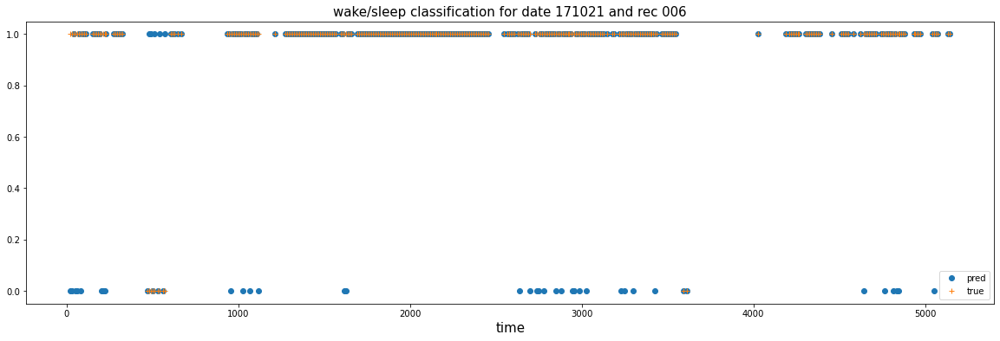

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.7_EPOCH0.pt
val loss:2.6410269737243652, val accuracy:0.8643923964697895, val percentage postive:0.8616768717765808


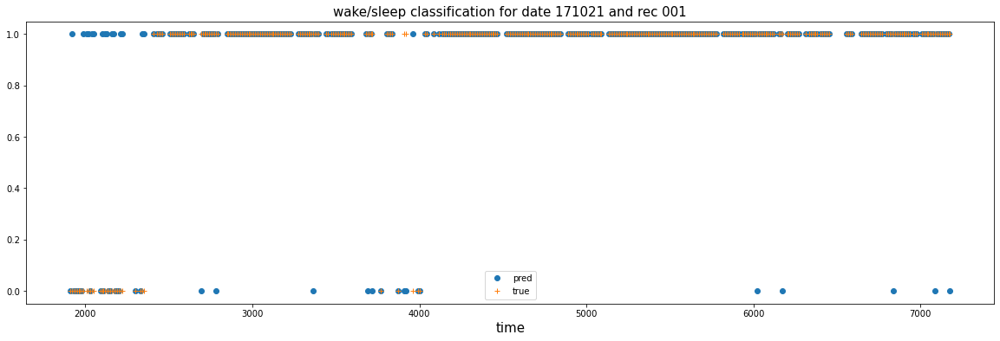

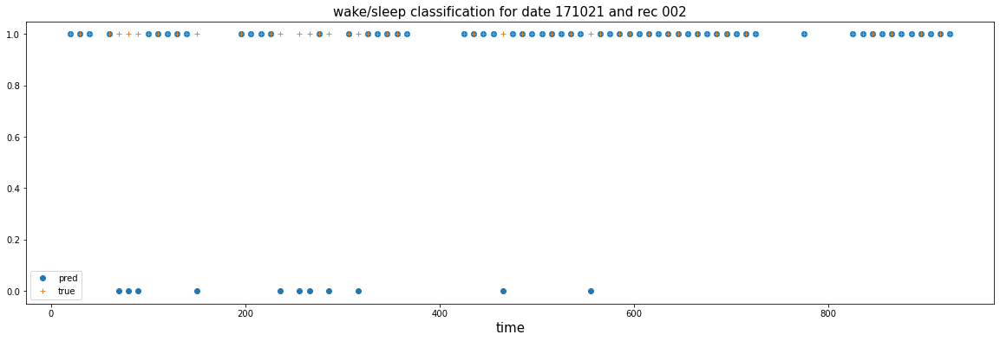

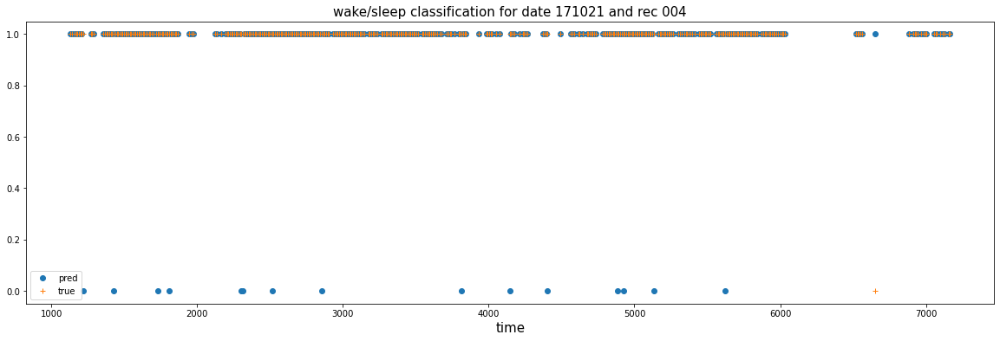

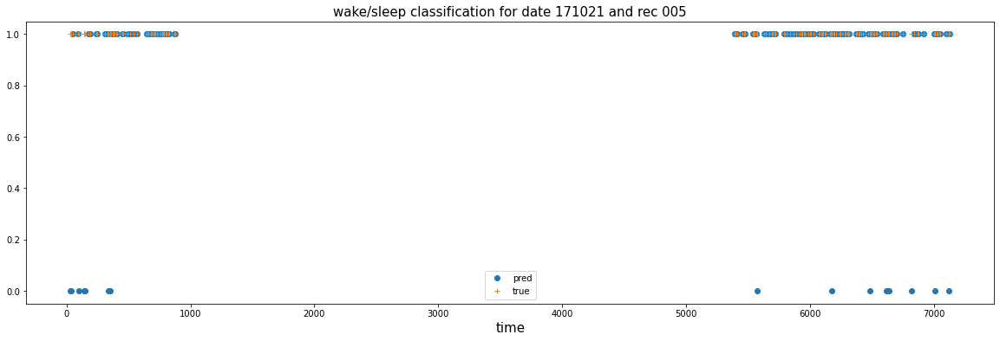

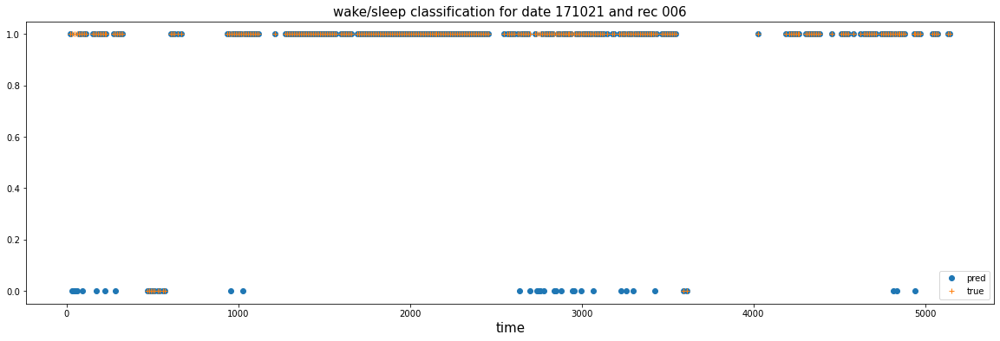

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO0.9_EPOCH5.pt
val loss:3.6876072883605957, val accuracy:0.821622539035981, val percentage postive:0.8616768717765808


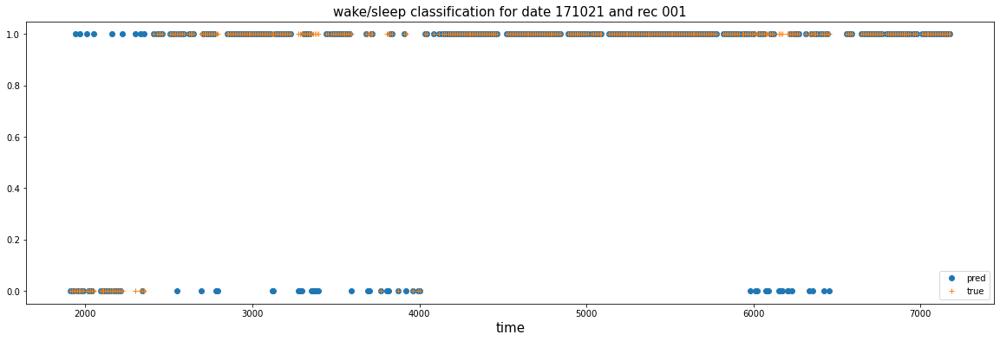

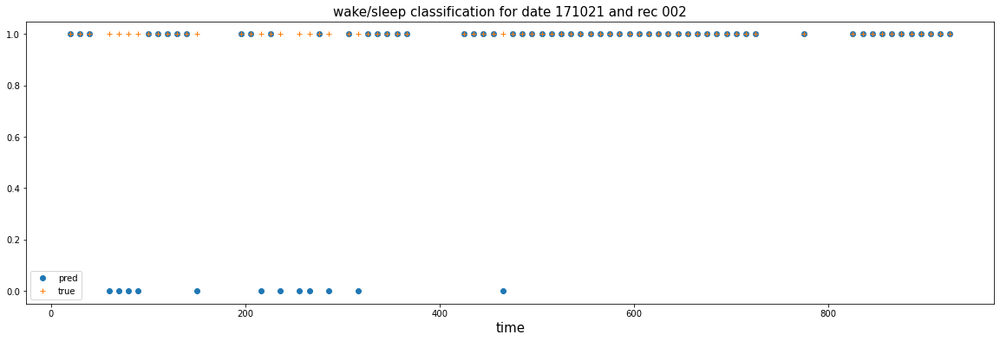

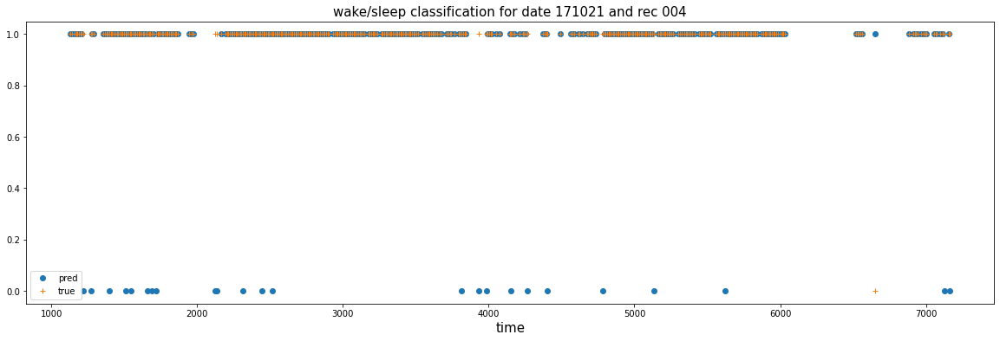

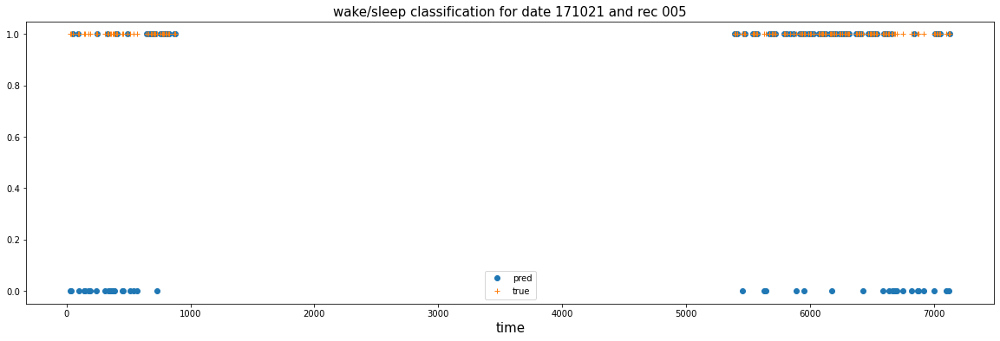

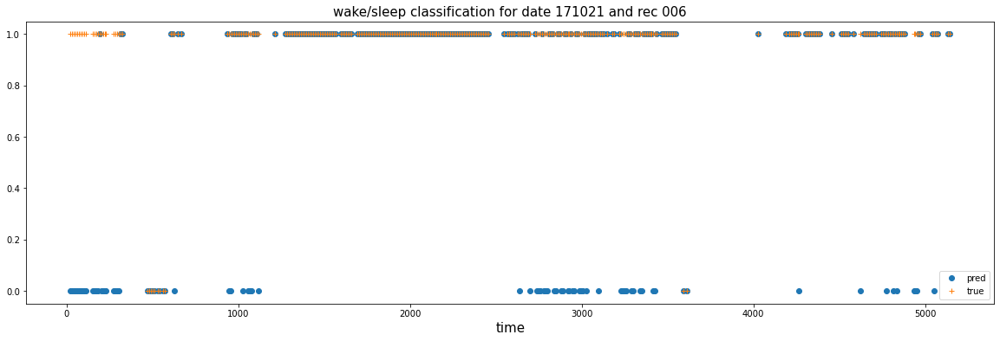

/home/bijanadmin/Desktop/Goose_and_Jester_data/data_Goose_all_Jester_all_2/ANN_model/MLP_CHall_LOSSbce_REGnone0_DO1_EPOCH25.pt
val loss:0.7894833087921143, val accuracy:0.16395112016293278, val percentage postive:0.8616768717765808


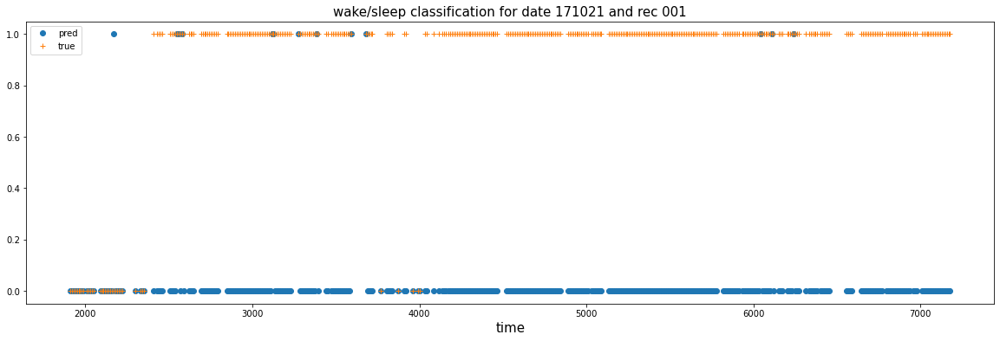

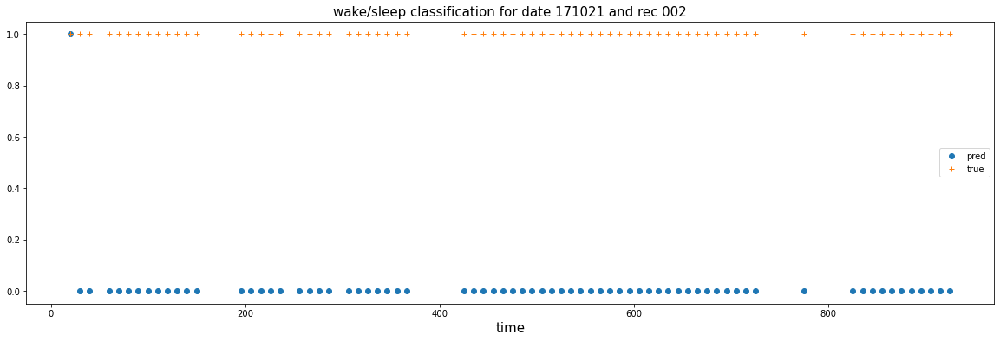

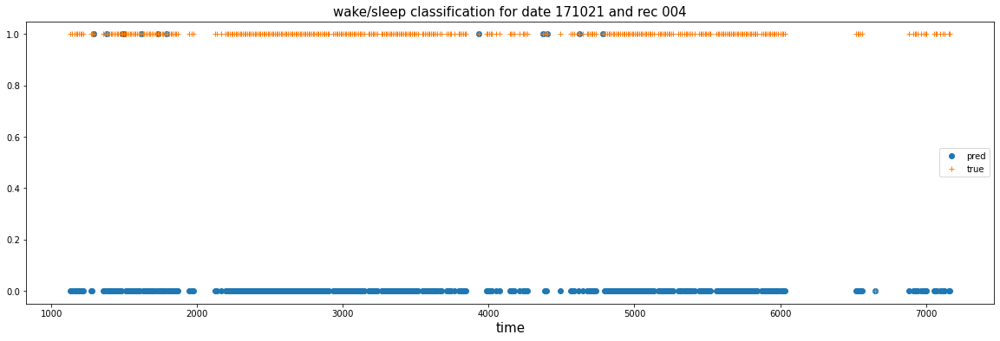

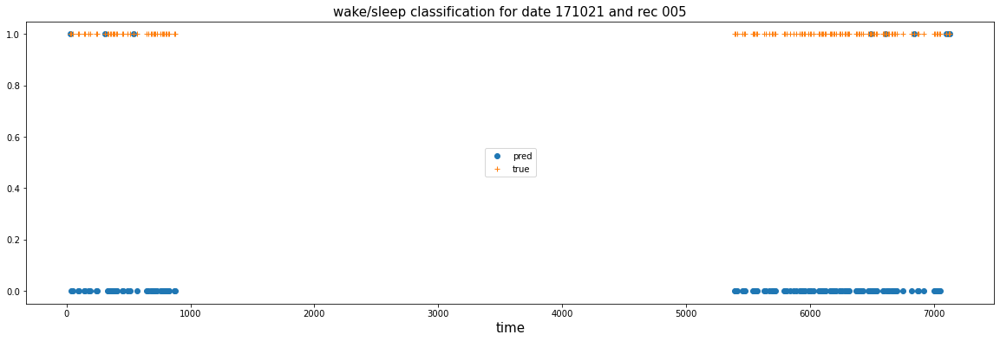

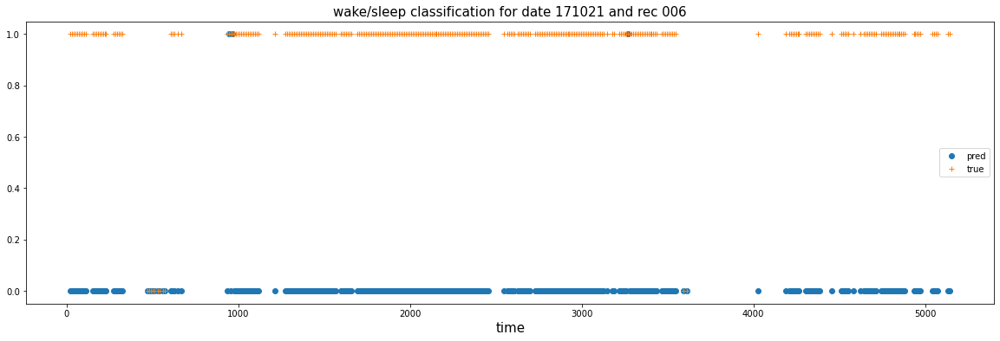

In [35]:
for i,(index,row) in enumerate(best_results.iterrows()):
    model = MLP().to(device)
    path = save_path
    if index == 1.0:
        index = 1
    DO = index
    best_epoch = int(row)
    ## Load best model
    model = MLP(input_dim=input_dim, embed_dim=embed_dim).to(device)
    model.load_state_dict(torch.load('{}/{}_CH{}_LOSS{}_REG{}{}_DO{}_EMBED{}_EPOCH{}_MODEL_{}.pt'.format(
    save_path, model_type, CH, loss_type, reg_type, alpha, DO, embed_dim, best_epoch,model_name)))
    print('{}/{}_CH{}_LOSS{}_REG{}{}_DO{}_EPOCH{}.pt'.format(path, model_type, CH, loss_type, reg_type, alpha,DO, best_epoch))
    ## Predict vs truth
    val_loss, val_acc, val_preds, val_preds_probs, val_labels, val_dates, val_recs, val_times, cases_wrong_0 = evaluate(model, optimizer, val_loader, alpha=alpha, model_type=model_type, loss_type=loss_type, reg_type=reg_type, collect_result=True, device=device)
    print('val loss:{}, val accuracy:{}, val percentage postive:{}'.format(val_loss, val_acc, np.mean(np.concatenate(val_labels))))
    plot_pred_vs_true(val_preds, val_labels, val_dates, val_recs, val_times, date_1='171021')